# Анализ целевой аудитории ресурса Wikipedia
## Цели проекта
Выявление на основании статистических данных о пользователях ресурса Wikipedia и сведениях об их голосовании различных сегментов и их предпочтений

## Задачи проекта
1) проведение сегментации пользователей
2) анализ активности пользователей
3) анализ устойчивость предпочтений пользователей
4) анализ динамики голосований
5) выявление "аномальных" пользователей
6) кластеризация пользователей

### 0 Загрузка данных

In [1]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import re

In [2]:
gpath = "https://drive.google.com/uc?export=download&id="
wiki_arb = pd.read_excel(gpath + "???????")
wiki_stat = pd.read_excel(gpath + "???????????")

In [3]:
#wiki_stat = pd.read_excel('C:/Users/Asus/Яндекс_практикум/Мастерская 1/wiki_stat_full.xlsx')
#wiki_arb = pd.read_excel('C:/Users/Asus/Яндекс_практикум/Мастерская 1/wiki_arbcom.xlsx')

### 1 Предобработка

#### 1.1 wiki_stat

Выявлено, что Groups в wiki_stat содержит пустые значения, H/d в wiki_stat данные представлены в текстовом формате. Поэтому, все пустые значения в Groups были заменены на группу "other". Значения атрибута H/d были преобразован в минуты avgtime с помощью функции с использованием регулярных выражений, преобразования типов и простого математического выражения.


In [4]:
# замена пропусков в столбце Groups на other
wiki_stat['Groups'] = wiki_stat['Groups'].fillna('other')

In [5]:
# разделение столбца H/d и перевод значений в минуты с помощью функции с использованием регулярных выражений

wiki_stat['H/d'] = wiki_stat['H/d'].astype(str) #преобразовываем значения в строчные
# регулярные выражения
pattern_hours = '\d* h' #для выделения значения "часы"
pattern_min = '\d* m' #для выделения значения "минуты"
pattern= '\d*' #для выделения числа

# функция для разделения по регулярному выражению
def find_pattern(string, pattern):
    if re.search(pattern, string):
        return re.search(pattern, string).group(0)
    
wiki_stat['hours'] = wiki_stat['H/d'].apply(lambda x: find_pattern(x, pattern_hours)) #новый столбец со сзначениями типа Х h
wiki_stat['min'] = wiki_stat['H/d'].apply(lambda x: find_pattern(x, pattern_min)) #новый столбец со сзначениями типа Х m

wiki_stat['h'] = wiki_stat['hours'].astype(str).apply(lambda x: find_pattern(x, pattern)) #новый столбец со сзначениями типа Х
wiki_stat['m'] = wiki_stat['min'].astype(str).apply(lambda x: find_pattern(x, pattern)) #новый столбец со сзначениями типа Х

# перевод  и замена значений в числа
wiki_stat['h'] = wiki_stat['h'].replace('',0).astype(int)
wiki_stat['m'] = wiki_stat['m'].replace('',0).astype(int)

# создание столбца с расчетом среднего времени в минутах
wiki_stat['avgtime'] = wiki_stat['h'] * 60 + wiki_stat['m']

# удаление лишних столбцов
wiki_stat = wiki_stat.drop(columns=['h', 'm', 'hours', 'min', 'H/d'])

In [ ]:
# Код ревьюера
def minutes(row):
    if 'h' in row and len(row)>3:
        minutes=int(row.split(' ')[0])*60+int(row.split(' ')[-1])
    elif 'm' in row:
        minutes=int(row.split(' ')[0])
    else:
        minutes=int(row.split(' ')[0])*60
    return minutes   

In [6]:
# переименуем столбцы
wiki_stat = wiki_stat.rename(columns={'User' : 'user',
                                      'Groups' : 'groups',
                                      'EditsTotal' : 'edits_total',
                                      'EditsEdits' : 'edits_edits',
                                      'EditsArticles' : 'edits_articles',
                                      'CreationsPages' : 'creations_pages',
                                      'CreationsArticles' : 'creations_articles',
                                      'TextsVolume' : 'texts_volume',
                                      'Logs' : 'logs',
                                      'Months' : 'months'})

In [ ]:
# КОД РЕВЬЮЕРА
import re

def add_underscore(s):
    return re.sub(r'(?<!^)(?=[A-Z][a-z])', '_', s).lower()

for i in ['Groups', 'EditsTotal', 'EditsArticle', 'CreationPage']: 
  print (add_underscore(i)) 

#### 1.2 Добавление новых столбцов с рачетами в wiki_stat

Добавлены новые столбцы в датафрейм
   - общее время проведенное в Wikipedia в минутах: количество месяцев * 31 * среднее время в минутах в день
   - количество созданных статей в месяц: количество статей / количество месяцев
   - количество созданных страниц в месяц: количество страниц / количство месяцев
   - размер 1 изменения: объем текста / общее количество изменений
   - число логов в минуту : количество логов / общее время

In [7]:
# общее время в минутах
wiki_stat['all_time'] = 31 * wiki_stat['months'] * wiki_stat['avgtime']
# количество созданных статей в месяц
wiki_stat['article_in_month'] = wiki_stat['creations_articles'] / wiki_stat['months']
# количество созданных страниц в месяц
wiki_stat['pages_in_month'] = wiki_stat['creations_pages'] / wiki_stat['months']
# размер 1 изменения
wiki_stat['edit_volume'] = wiki_stat['texts_volume'] / wiki_stat['edits_total']
# логов в минуту
wiki_stat['logs_per_min'] = wiki_stat['logs'] / wiki_stat['all_time']

In [8]:
wiki_stat.describe().style.format("{:.2f}")

,Unnamed: 0,edits_total,edits_edits,edits_articles,creations_pages,creations_articles,texts_volume,logs,months,avgtime,all_time,article_in_month,pages_in_month,edit_volume,logs_per_min
count,2828.00,2828.00,2828.00,2828.00,2828.00,2828.00,2828.00,2828.00,2828.00,2828.00,2828.00,2828.00,2828.00,2828.00,2828.00
mean,1413.50,25260.69,20305.71,14264.88,1608.50,445.89,10756208.46,4955.04,91.86,48.71,129225.71,5.15,19.60,491.72,0.03
std,816.52,41604.76,32712.98,23723.76,8682.66,1582.15,18204416.66,14048.32,53.26,34.24,111561.05,19.52,166.48,416.31,0.07
min,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,5.00,155.00,0.00,0.00,0.00,0.00
25%,706.75,6389.75,5687.25,3767.25,156.00,29.00,2300000.00,251.25,46.00,30.00,58590.00,0.43,2.27,270.77,0.00
50%,1413.50,11238.50,9608.00,6478.50,471.00,103.00,4900000.00,1011.00,86.00,45.00,98735.00,1.37,6.42,412.39,0.01
75%,2120.25,24941.25,20983.50,14360.75,1316.50,329.00,11000000.00,3642.75,134.00,60.00,167090.00,4.25,15.87,607.31,0.03
max,2827.00,670625.00,658747.00,277881.00,423066.00,47062.00,288000000.00,290315.00,229.00,660.00,1383840.00,536.73,8634.00,9225.70,2.16


Добавлены категориальные атрибуты в зависимости от значений количества созданных статей/страниц в месяц, общего времени, размера 1 изменения в зависимости от след. критериев:
   - группа А: (0; медиана)
   - группа B: [медиана; среднее]
   - группа С: (среднее; inf)

In [9]:
def categorize_articles(a):
    if 0 < a < 1.37:
        return 'A'
    elif 1.37 <= a <= 5.15:
        return 'B'
    elif a > 5.15:
        return 'C'

def categorize_pages(b):
    if 0 < b < 6.42:
        return 'A'
    elif 6.42 <= b <= 19.6:
        return 'B'
    elif b > 16.6:
        return 'C'
    
def categorize_avgtime(c):
    if 0 < c < 30:
        return 'A'
    elif 30 <= c <= 45:
        return 'B'
    elif c > 45:
        return 'C'

def categorize_edit(d):
    if 0 < d < 270:
        return 'A'
    elif 270 <= d <= 491:
        return 'B'
    elif d > 491:
        return 'C'

In [10]:
def categorize_time(t):
    if 0 < t < 98000:
        return 'A'
    elif 98000 <= t <= 129000:
        return 'B'
    elif t > 129000:
        return 'C'

In [11]:
wiki_stat['categorize_articles'] = wiki_stat['article_in_month'].apply(categorize_articles)
wiki_stat['categorize_pages'] = wiki_stat['pages_in_month'].apply(categorize_pages)
wiki_stat['categorize_avgtime'] = wiki_stat['avgtime'].apply(categorize_avgtime)
wiki_stat['categorize_edit'] = wiki_stat['edit_volume'].apply(categorize_edit)

In [12]:
wiki_stat['categorize_time'] = wiki_stat['all_time'].apply(categorize_time)

#### Предобработка 1.3 wiki_arb
Необходимо только переименование столбца

In [13]:
wiki_arb = wiki_arb.rename(columns={'voter' : 'user'})

### 2 Анализ данных wiki_stat  (сегментация)

#### 2.1 Уникальные пользователи

В датафрейме wiki_arb с данными о голосовании есть сведения о 698 уникальных пользователях, которые голосуют за 62 кандидата (также являются пользователями и голосуют). В тоже время общая статистика о пользователях содержит информацию о 2828 уникальных (по имени) пользователях).

In [14]:
wiki_arb['user'].value_counts()

Darkhan              98
Kolchak1923          98
Redfog               98
Helga Regin          98
Inctructor           98
                     ..
22mirbymirbymirby     1
DNikon                1
Котик полосатый       1
Yxag                  1
Guest Kashapov        1
Name: user, Length: 698, dtype: int64

In [15]:
wiki_stat['user'].value_counts()

MarchHare1977           1
Аведон                  1
Taras Cherepenko        1
Sidoroff-B              1
Gradmir                 1
                       ..
Wikiredaktor 3120213    1
Travkin Vladimir        1
Кржижановский           1
Vladimir Ivanov         1
MaxBioHazard            1
Name: user, Length: 2828, dtype: int64

#### 2.2 Сводные данные по выделенным ранее сегментам

In [16]:
collist_1 = ['groups', 'categorize_articles', 'categorize_pages', 'categorize_avgtime', 'categorize_edit', 'categorize_time']

for i in collist_1:
    display(wiki_stat.groupby([i]).agg(
                                      {'user' : 'count', 
                                       'edits_total' : 'mean', 
                                       'edits_articles' : 'mean', 
                                       'creations_pages' : 'mean',
                                       'creations_articles' : 'mean',
                                       'months' : 'mean', 
                                       'avgtime' : 'mean',
                                       'all_time' : 'mean',
                                       'article_in_month' : 'mean',
                                       'pages_in_month' : 'mean',
                                       'edit_volume' : 'mean',
                                       'logs_per_min' : 'mean'}).style.format("{:.2f}").background_gradient(cmap='Blues', axis=0))

,user,edits_total,edits_articles,creations_pages,creations_articles,months,avgtime,all_time,article_in_month,pages_in_month,edit_volume,logs_per_min
groups,,,,,,,,,,,,
BOS,1.00,33489.00,9352.00,928.00,130.00,163.00,55.00,277915.00,0.80,5.69,597.21,0.03
BS,4.00,69173.50,20333.00,4233.25,465.25,174.00,43.75,232926.25,2.31,21.77,576.19,0.07
COS,3.00,270855.00,66626.33,22830.00,261.00,161.33,113.33,449293.33,1.52,213.29,491.58,0.23
I,2.00,46373.00,10997.00,1769.50,401.00,161.50,42.50,212272.50,2.57,11.06,899.13,0.11
IS,2.00,82373.50,25336.50,1699.50,113.00,151.00,60.00,280860.00,0.83,10.83,490.77,0.07
OS,1.00,88131.00,20216.00,4059.00,373.00,149.00,60.00,277140.00,2.50,27.24,544.64,0.14
S,60.00,90587.38,32522.18,4587.75,900.47,153.87,60.17,283562.17,5.46,28.94,464.14,0.11
other,2755.00,23424.18,13795.40,1515.87,436.58,90.17,48.39,125087.36,5.16,19.20,491.85,0.03


,user,edits_total,edits_articles,creations_pages,creations_articles,months,avgtime,all_time,article_in_month,pages_in_month,edit_volume,logs_per_min
categorize_articles,,,,,,,,,,,,
A,1340.00,16535.57,8576.43,514.47,51.72,97.04,39.87,112999.40,0.53,5.25,434.61,0.02
B,810.00,25327.86,13627.64,1170.77,251.37,89.94,50.86,132054.26,2.81,12.89,500.88,0.04
C,602.00,46735.78,28792.43,4823.96,1641.32,87.69,65.16,170838.32,19.24,62.48,635.64,0.04


,user,edits_total,edits_articles,creations_pages,creations_articles,months,avgtime,all_time,article_in_month,pages_in_month,edit_volume,logs_per_min
categorize_pages,,,,,,,,,,,,
A,1399.00,11553.86,7243.10,241.75,71.89,93.16,37.18,99357.33,0.80,2.58,452.92,0.02
B,824.00,25046.88,13492.94,1045.82,312.29,91.96,49.49,133921.32,3.48,11.37,530.17,0.04
C,590.00,58495.55,32171.68,5676.06,1530.67,89.97,73.92,195353.86,17.93,71.97,540.31,0.05


,user,edits_total,edits_articles,creations_pages,creations_articles,months,avgtime,all_time,article_in_month,pages_in_month,edit_volume,logs_per_min
categorize_avgtime,,,,,,,,,,,,
A,542.00,7021.17,4500.13,426.48,153.02,108.70,20.65,68977.00,1.47,3.85,576.17,0.02
B,1013.00,13752.60,8092.54,800.81,253.90,95.52,37.03,109458.92,3.20,8.68,504.95,0.02
C,1273.00,42184.11,23334.08,2754.48,723.37,81.78,69.95,170607.15,8.27,35.01,445.24,0.05


,user,edits_total,edits_articles,creations_pages,creations_articles,months,avgtime,all_time,article_in_month,pages_in_month,edit_volume,logs_per_min
categorize_edit,,,,,,,,,,,,
A,705.00,31634.25,18824.42,1982.32,274.88,91.70,53.97,134839.45,3.31,29.02,177.84,0.05
B,1075.00,27542.30,15242.95,1560.68,402.15,94.54,49.97,139295.83,4.22,16.58,376.98,0.03
C,1047.00,18644.50,10204.11,1407.42,606.39,89.29,43.90,115217.85,7.36,16.39,821.35,0.02


,user,edits_total,edits_articles,creations_pages,creations_articles,months,avgtime,all_time,article_in_month,pages_in_month,edit_volume,logs_per_min
categorize_time,,,,,,,,,,,,
A,1404.00,8078.88,4716.69,458.87,166.66,57.41,41.53,57155.92,4.23,12.54,523.95,0.03
B,390.00,14500.35,8938.12,779.29,249.03,101.56,42.56,113319.71,2.96,9.92,482.09,0.02
C,1034.00,52649.26,29238.87,3482.25,899.30,134.97,60.77,233083.87,7.23,32.85,451.60,0.04


Как видно из первой таблицы, сегментация пользователей по признаку принадлежности к группе (по правам) не является полной, т.к. данный признак отмечен для незначительной части пользователей.

Возможно сегментировать пользователей по введенным категориальным значениям в зависимости от количества созданных статей/страниц в месяц, общего времени, размера 1 изменения и т.д.

Например, выделено 3 сегмента пользователей (по количеству созданных статей), какждый из которых в среднем создали по 50, 150 и 1600 статей за все время своего пребывания на википедии (для первого А, второго В и третьего С сегмента соответственно), что соответствует 0,5, 3, 19 статьям в месяц. Пользователей из сегмента А больше всего (около 1300) и они провели в википедии в среднем больще времени, чем пользователи их других сегментов (93, 91, 90 месяцев соответственно). При этом по другим показателям заметно отстают от пользователей из сегмнтов В и С, в т.ч. гораздо меньше правят, создают страницы и т.д.

Аналогичную картину можно наблюдать, если разделить пользователей на сегменты по признаку количества созданных страниц.

Если разделить пользователей по признаку средней длительности "сессии" в день, то увидим примерно такую же картину, только с одной оговоркой. Пользователи, которые меньше всего проводят времени в википедии (это самый малочисленный сегмент) в среднем зарегистрированы дольше, чем более активные пользователи, и вносят за 1 раз больший объем правок, чем остальные пользователи.

Самую интересную картину можно наблюдать, если разделить пользователей по признаку размера 1 правки: первый сегмент пользователей, который вносит правки минимального объема, также является самым малочисленным сегментом, но при этом вносит в количественном выражении больше всего правок и создает больше всего страниц, практически дольше всех остальных пользователей из других сегментов присутсвуют в википедии и совешают больше "входов/логов"

Данные зависимости также можно наблюдать в графическом виде, приведем некоторые из них. По осям отложены основные характерные для разных сегментов параметры, в виде категорий - соответствующие сегменты

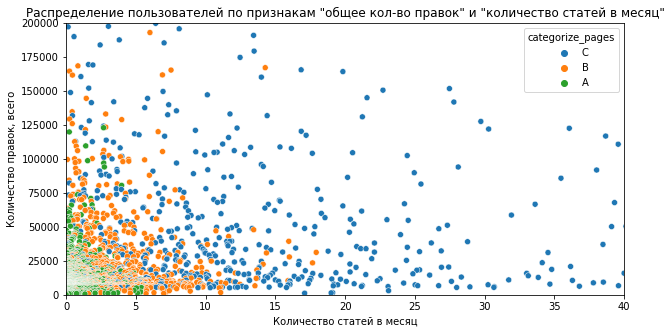

In [17]:
plt.figure(figsize=(10,5))
sns.scatterplot(data=wiki_stat, x='article_in_month', y = 'edits_total', hue='categorize_pages')
plt.xlim(0, 40)
plt.ylim(0, 200000)
plt.title('Распределение пользователей по признакам "общее кол-во правок" и "количество статей в месяц"')
plt.xlabel('Количество статей в месяц')
plt.ylabel('Количество правок, всего')
plt.show()

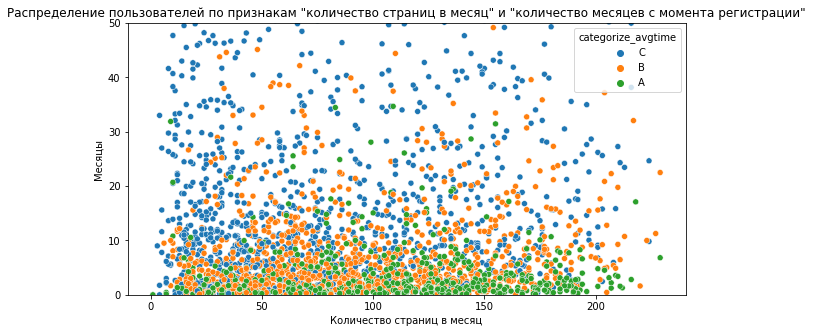

In [18]:
plt.figure(figsize=(10,5))
sns.scatterplot(data=wiki_stat, x='months', y = 'pages_in_month', hue='categorize_avgtime')
#plt.xlim(0, 100)
plt.ylim(0, 50)
plt.title('Распределение пользователей по признакам "количество страниц в месяц" и "количество месяцев с момента регистрации"')
plt.xlabel('Количество страниц в месяц')
plt.ylabel('Месяцы')
plt.show()

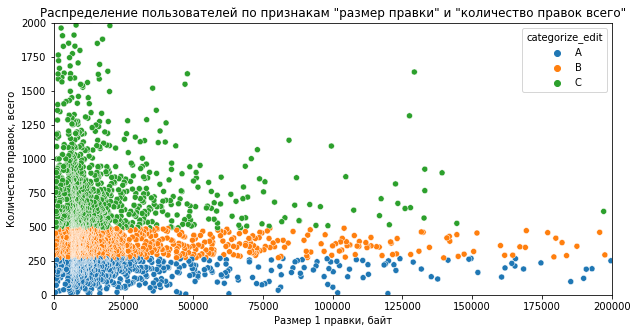

In [19]:
plt.figure(figsize=(10,5))
sns.scatterplot(data=wiki_stat, x='edits_total', y = 'edit_volume', hue='categorize_edit')
plt.xlim(0, 200000)
plt.ylim(0, 2000)
plt.title('Распределение пользователей по признакам "размер правки" и "количество правок всего"')
plt.xlabel('Размер 1 правки, байт')
plt.ylabel('Количество правок, всего')
plt.show()

#### 2.3 Дополнительная сегментация

Дополнительно сегментировать пользователей также можно с помощью существующих заданных классов их перебора и объединения. Т.е. имея различную классификацию пользователей по сегментам А, В, С в зависимости от различных характеристик, иожно задать новые сегменты из комбинации существующих, например, ААВС - мало статей, мало страниц, среднее "среднее время", объемные правки

In [20]:
wiki_stat['group_category_1'] = (wiki_stat['categorize_articles'] 
                          + wiki_stat['categorize_pages'] 
                          + wiki_stat['categorize_avgtime']
                          + wiki_stat['categorize_edit'])

In [21]:
wiki_stat.groupby(['group_category_1']).agg(
                                      {'user' : 'count', 
                                       'edits_total' : 'mean', 
                                       'edits_articles' : 'mean', 
                                       'creations_pages' : 'mean',
                                       'creations_articles' : 'mean',
                                       'months' : 'mean', 
                                       'avgtime' : 'mean',
                                       'all_time' : 'mean',
                                       'article_in_month' : 'mean',
                                       'pages_in_month' : 'mean',
                                       'edit_volume' : 'mean',
                                       'logs_per_min' : 'mean'}).style.format("{:.2f}").background_gradient(cmap='Blues', axis=0)

,user,edits_total,edits_articles,creations_pages,creations_articles,months,avgtime,all_time,article_in_month,pages_in_month,edit_volume,logs_per_min
group_category_1,,,,,,,,,,,,
AAAA,99.00,7195.00,4909.73,155.84,33.55,118.33,19.34,69317.88,0.28,1.27,181.09,0.02
AAAB,137.00,7054.14,4802.64,211.47,55.82,118.20,21.20,76548.50,0.45,1.68,367.71,0.01
AAAC,124.00,5364.41,3072.06,188.10,52.65,103.02,20.12,63062.50,0.49,1.74,791.49,0.01
AABA,135.00,13367.66,8868.78,222.70,46.40,103.04,35.56,112745.85,0.43,2.17,173.73,0.03
AABB,180.00,10676.02,6573.09,247.18,49.92,91.86,36.03,103200.72,0.54,2.58,370.93,0.01
AABC,145.00,10379.50,4975.77,235.39,48.23,92.68,36.59,104451.83,0.53,2.39,747.74,0.01
AACA,88.00,21617.69,13841.09,196.98,34.55,74.67,60.97,132627.16,0.46,2.52,165.03,0.05
AACB,92.00,18865.84,11670.17,272.16,49.10,82.28,57.12,143811.36,0.57,3.10,383.56,0.02
AACC,83.00,13878.61,5967.27,219.93,40.16,73.57,55.66,126481.87,0.54,2.85,762.88,0.01


In [22]:
wiki_stat['group_category_2'] = (wiki_stat['categorize_articles'] 
                          + wiki_stat['categorize_pages'] 
                          + wiki_stat['categorize_avgtime'])
                          

In [23]:
wiki_stat.groupby(['group_category_2']).agg(
                                      {'user' : 'count', 
                                       'edits_total' : 'mean', 
                                       'edits_articles' : 'mean', 
                                       'creations_pages' : 'mean',
                                       'creations_articles' : 'mean',
                                       'months' : 'mean', 
                                       'avgtime' : 'mean',
                                       'all_time' : 'mean',
                                       'article_in_month' : 'mean',
                                       'pages_in_month' : 'mean',
                                       'edit_volume' : 'mean',
                                       'logs_per_min' : 'mean'}).style.format("{:.2f}").background_gradient(cmap='Blues', axis=0)

,user,edits_total,edits_articles,creations_pages,creations_articles,months,avgtime,all_time,article_in_month,pages_in_month,edit_volume,logs_per_min
group_category_2,,,,,,,,,,,,
AAA,360.00,6510.86,4236.00,188.12,48.60,113.01,20.32,69914.90,0.42,1.59,462.36,0.01
AAB,460.00,11372.49,6743.32,236.28,48.36,95.40,36.07,106396.38,0.51,2.40,431.83,0.02
AAC,263.00,18212.70,10596.79,230.52,41.41,76.98,57.95,134600.11,0.52,2.83,430.15,0.02
ABA,16.00,9768.75,4932.62,1077.00,101.56,118.12,22.81,83942.19,0.82,9.54,503.00,0.02
ABB,74.00,17385.30,8051.70,987.15,74.97,104.73,38.18,122267.77,0.72,9.33,427.94,0.02
ABC,117.00,43790.47,17902.36,989.97,65.32,90.93,64.23,179001.15,0.73,10.77,430.88,0.08
ACA,1.00,40643.00,12714.00,15052.00,23.00,206.00,25.00,159650.00,0.11,73.07,71.35,0.06
ACB,11.00,23338.91,9937.09,3093.64,98.00,111.09,36.36,127494.55,0.81,30.63,368.96,0.03
ACC,38.00,77073.66,31242.97,5188.34,72.55,92.29,82.89,237145.92,0.73,55.39,260.39,0.07


In [24]:
wiki_stat['group_category_3'] = (wiki_stat['categorize_articles'] 
                                 + wiki_stat['categorize_avgtime'])

In [25]:
wiki_stat.groupby(['group_category_3']).agg(
                                      {'user' : 'count', 
                                       'edits_total' : 'mean', 
                                       'edits_articles' : 'mean', 
                                       'creations_pages' : 'mean',
                                       'creations_articles' : 'mean',
                                       'months' : 'mean', 
                                       'avgtime' : 'mean',
                                       'all_time' : 'mean',
                                       'article_in_month' : 'mean',
                                       'pages_in_month' : 'mean',
                                       'edit_volume' : 'mean',
                                       'logs_per_min' : 'mean'}).style.format("{:.2f}").background_gradient(cmap='Blues', axis=0)

,user,edits_total,edits_articles,creations_pages,creations_articles,months,avgtime,all_time,article_in_month,pages_in_month,edit_volume,logs_per_min
group_category_3,,,,,,,,,,,,
AA,377.00,6739.66,4288.05,265.27,50.78,113.47,20.44,70748.25,0.43,2.11,463.05,0.01
AB,545.00,12430.43,6985.43,395.90,52.97,96.98,36.36,108977.23,0.54,3.91,430.03,0.02
AC,418.00,30723.02,14518.57,893.81,50.93,82.28,61.97,156350.50,0.60,9.83,414.92,0.04
BA,93.00,8264.35,5244.11,689.88,278.01,109.52,22.15,75080.00,2.62,6.48,708.56,0.02
BB,309.00,15006.18,8855.11,972.85,266.89,97.75,37.69,114188.35,2.70,9.27,525.30,0.02
BC,408.00,37034.49,19153.08,1430.27,233.54,79.55,67.38,158571.84,2.94,17.09,435.05,0.05
CA,38.00,9462.87,6240.71,1689.92,998.37,98.82,22.24,67355.66,10.25,16.97,1660.48,0.02
CB,137.00,17287.21,11172.11,2145.20,1064.72,90.96,38.58,108094.96,15.43,27.60,786.85,0.02
CC,427.00,59501.18,36452.73,5962.33,1883.54,85.65,77.51,200178.33,21.26,77.72,495.92,0.04


Подобная сегментация на мой взгляд более наглядная и детальная. Так, по комбинации сегментов по кол-ву статей и среднему проведенному времени в сутки в елом наблюдается та же картина, что и описана выше (в сегменте А мало пишут статей, а в С больше всего), при этом уже явно видно, что пользователи, которые мало пишут и мало проводят в среднем времени в Википедии - одни из самых "древних" - среднее время с момента регистрации - почти 9-10 лет (сегменты АА и ВА). А пользователи, которые генерируют больший объем на одну правку - те, кто пишет много статей в целом но "быстро" (их среднее время пребывания в сегменте А) - комбинированный сегмент таких пользователей - СА

#### 2.4 Корреляции

В рамках "не строгой" классификации значений коэффициента корреляций в преобразованном датафрейме wiki_stat выявлено, что:
- очень сильная корреляция (>0,9) наблюдается между атрибутами **edits_total, edits_edits, edits_articles** (*что в целом объяснимо, т.к. данные атрибуты характеризуют только правки в тексте*), а также **pages_in month и creations_pages** (*по сути это одна и таже характеристика*)
- сильная корреляция (от 0,7 до 0,9) наблюдается между атрибутами **texts_volume, all_time** и **edits_total, edits_edits, edits_articles**, **texts_volume и all_time **, **articles_in_month и creations_articles** (*данные корреляции также в целом объяснимы*)
- средняя корреляция (от 0,5 +/-0,1 до 0,7) наблюдается между атрибутами **avgtime и edits_total, edits_edits, edits_articles** (*чем дольше сидишь, тем больше редактируешь*) **creations_articles и edits_total, edits_edits, edits_articles, creations_pages, text_volume** (*т.о. взаимосвязь между количеством созданных статей и количеством редактур не такая однозначная*)
- для остальных атрибутов наблюдается слабая как положительная, так и отрицательная корреляция - атрибуты не взаимосвзязаны

In [26]:
wiki_stat.corr().style.format("{:.2f}").background_gradient(cmap='Blues', axis=1)

C:\Users\Utilisateur\AppData\Local\Temp\ipykernel_38472\1270421516.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  wiki_stat.corr().style.format("{:.2f}").background_gradient(cmap='Blues', axis=1)


,Unnamed: 0,edits_total,edits_edits,edits_articles,creations_pages,creations_articles,texts_volume,logs,months,avgtime,all_time,article_in_month,pages_in_month,edit_volume,logs_per_min
Unnamed: 0,1.00,-0.63,-0.62,-0.60,-0.21,-0.28,-0.55,-0.43,-0.52,-0.40,-0.72,-0.17,-0.10,0.10,-0.29
edits_total,-0.63,1.00,0.96,0.89,0.55,0.45,0.76,0.73,0.35,0.54,0.83,0.31,0.39,-0.10,0.35
edits_edits,-0.62,0.96,1.00,0.95,0.61,0.49,0.73,0.50,0.36,0.53,0.84,0.34,0.46,-0.08,0.17
edits_articles,-0.60,0.89,0.95,1.00,0.43,0.50,0.69,0.44,0.36,0.47,0.82,0.31,0.26,-0.10,0.13
creations_pages,-0.21,0.55,0.61,0.43,1.00,0.48,0.35,0.21,0.09,0.36,0.34,0.52,0.96,-0.00,0.06
creations_articles,-0.28,0.45,0.49,0.50,0.48,1.00,0.62,0.20,0.16,0.24,0.39,0.80,0.33,0.13,0.06
texts_volume,-0.55,0.76,0.73,0.69,0.35,0.62,1.00,0.54,0.35,0.37,0.69,0.41,0.18,0.28,0.20
logs,-0.43,0.73,0.50,0.44,0.21,0.20,0.54,1.00,0.20,0.34,0.51,0.11,0.09,-0.09,0.64
months,-0.52,0.35,0.36,0.36,0.09,0.16,0.35,0.20,1.00,-0.17,0.61,-0.03,-0.02,-0.02,-0.01
avgtime,-0.40,0.54,0.53,0.47,0.36,0.24,0.37,0.34,-0.17,1.00,0.49,0.24,0.33,-0.11,0.16


### 3 Объединение данных

In [27]:
df = wiki_arb.merge(wiki_stat, on='user', how='left')

Добавим столбец == голос +1 - да, голос -1 - нет.

In [28]:
def yes_no(e):
    if e == 1:
        return 'yes'
    if e == -1:
        return 'no'

In [29]:
df['vote_category'] = df['vote'].apply(yes_no)

Добавим столбец, был ли голосующий кандидатом

In [30]:
candidates = df['candidate'].unique()
def is_candidate(user):
    if user in candidates:
        return 'yes'
    else:
        return 'no'
df['is_candidate'] = df['user'].apply(is_candidate)  

In [31]:
df.head()

,Unnamed: 0_x,user,can_vote,time,candidate,n,vote,Unnamed: 0_y,groups,edits_total,...,categorize_articles,categorize_pages,categorize_avgtime,categorize_edit,categorize_time,group_category_1,group_category_2,group_category_3,vote_category,is_candidate
0,0,X0stark69,True,2020-07-30 11:55:00,Adamant.pwn,30,1,190.0,other,80572.0,...,A,B,C,B,C,ABCB,ABC,AC,yes,no
1,1,Mike like0708,True,2020-07-30 09:32:00,Adamant.pwn,30,-1,1834.0,other,7942.0,...,A,A,A,B,A,AAAB,AAA,AA,no,no
2,2,Brateevsky,True,2020-07-30 14:43:00,Adamant.pwn,30,1,298.0,other,57471.0,...,B,B,C,B,C,BBCB,BBC,BC,yes,no
3,3,Forgottenous,True,2020-07-30 08:09:00,Adamant.pwn,30,1,1883.0,other,7652.0,...,B,A,C,C,A,BACC,BAC,BC,yes,no
4,4,Swarrel,True,2020-08-02 14:57:00,Adamant.pwn,30,1,988.0,other,17835.0,...,B,B,B,B,A,BBBB,BBB,BB,yes,no


In [32]:
df['candidate'].unique()

array(['Adamant.pwn', 'Alexander Roumega', 'Lesless',
       'Юрий Владимирович Л.', 'SerSem', 'Carn', 'Arsenal.UC',
       'OlegCinema', 'Grebenkov', 'Mihail Lavrov', 'Neolexx',
       'Uchastnik1', 'AndyVolykhov', 'Colt browning', 'Fedor Babkin',
       'Venzz', 'Сайга20К', 'Sir Shurf', 'Юлия 70', 'Artificial123',
       'Кронас', 'Wild lionet', 'Vyacheslav Bukharov', 'AndreiK',
       'Ouaf-ouaf2010', 'Джекалоп', 'Vallastro', 'AndyHomba',
       'Bapak Alex', 'Morihei Tsunemori', 'DENAMAX', 'Meteorych',
       'Всеслав Чародей', 'Wikisaurus', 'Ле Лой', 'Роман Беккер',
       'Abiyoyo', 'Excellence', 'Ailbeve', 'Niklitov', 'Butko',
       'Deltahead', 'Biathlon', 'Znatok251', 'Draa kul',
       'Engelberthumperdink', 'Grig siren', 'Wanderer777', 'Oleg Yunakov',
       'Гоголь М', 'Sas1975kr', 'Glavkom NN', 'El-chupanebrej',
       'La loi et la justice', 'Dimetr', 'Tatewaki', 'Helgo13',
       'Khinkali', 'Deinocheirus', 'Евгений Юрьев', 'Sand Kastle 17',
       'Vyacheslav84', 'Well

### 4 Анализ голосований

#### 4.1 Динамика голосов за кандидатов нарастающим итогом

In [33]:
#создаим копию объединенного датафрема
df_test = df.copy(deep=True)
#посчитаем накопленную сумму голосов за всех кандидатов в каждый момент времени
df_test_plot = df_test.groupby(['candidate', 'time', 'n']).agg({'vote' : 'sum'})
df_test_plot['cumsum'] = df_test_plot.groupby(['candidate', 'n'])['vote'].cumsum()


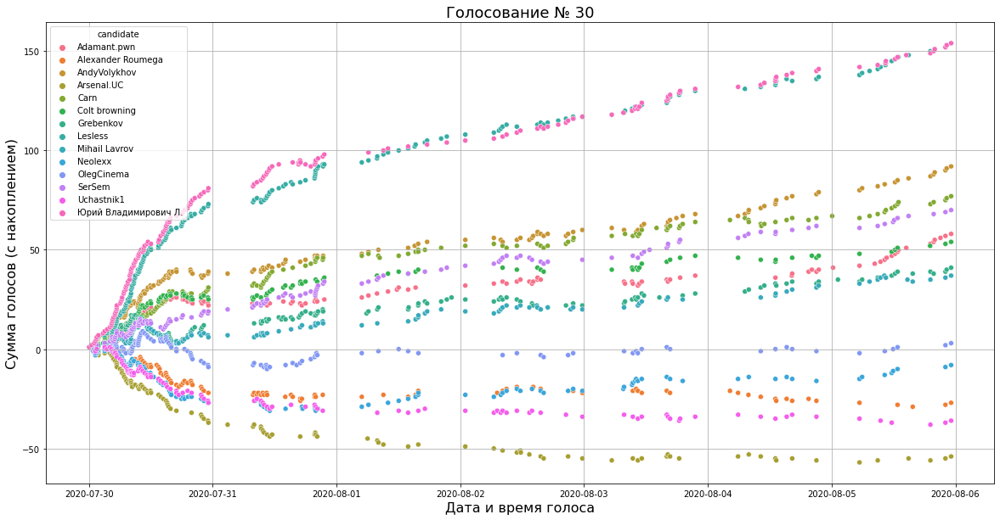

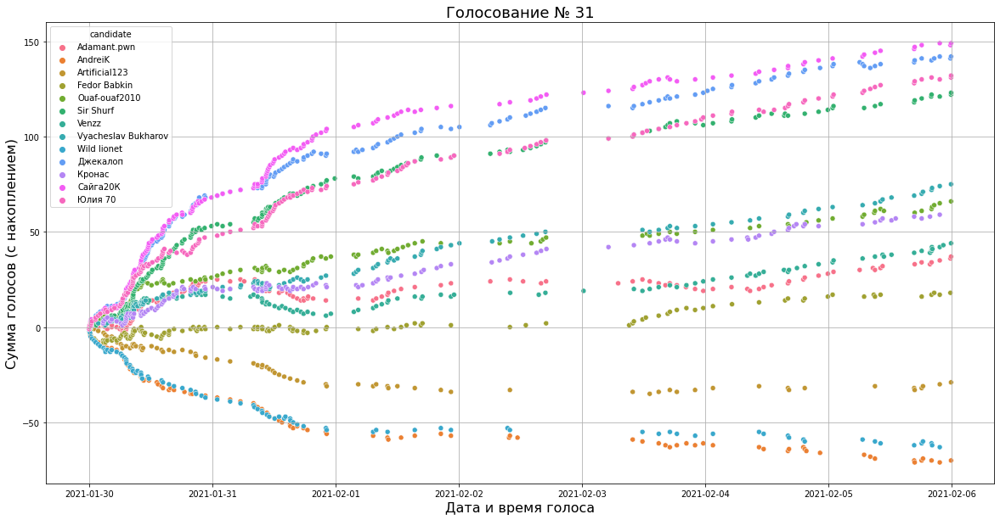

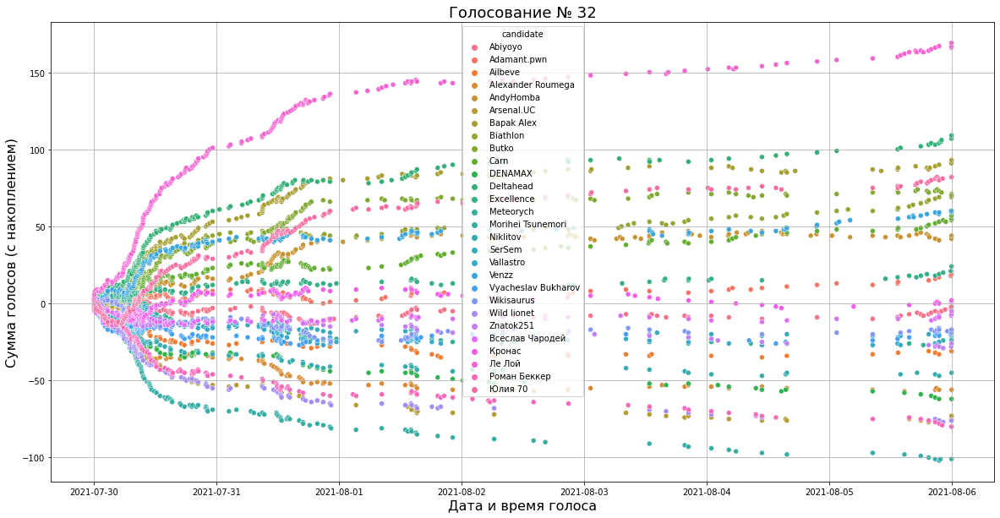

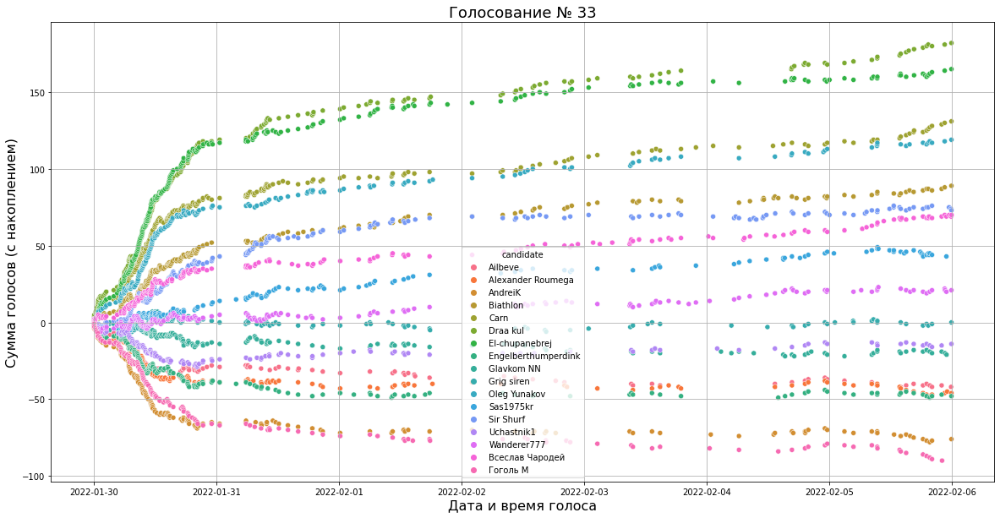

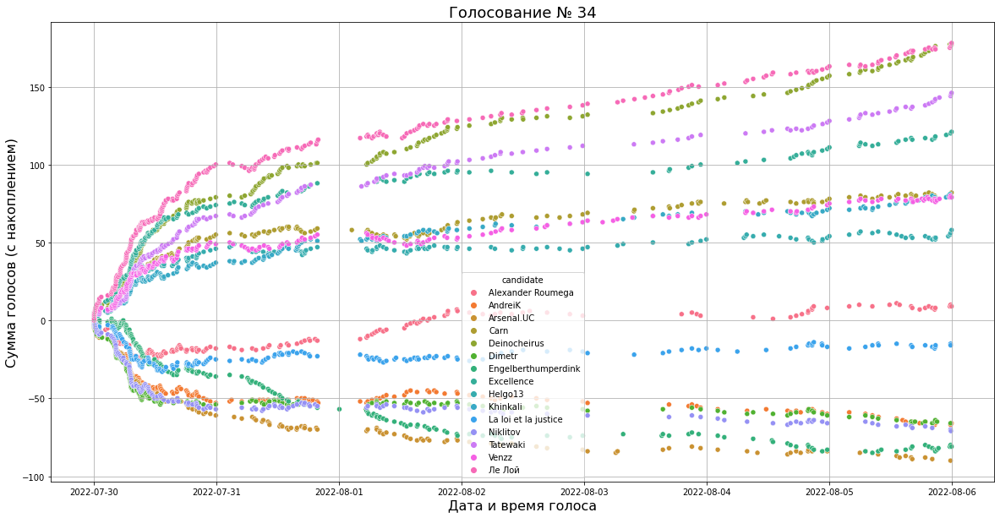

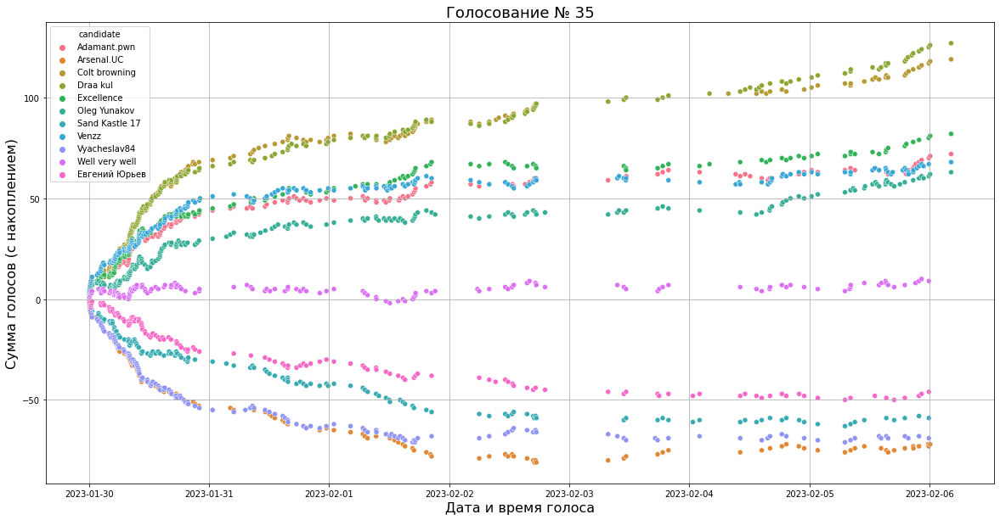

In [34]:
#построим графики динамики накопленной суммы циклом для всех голосований
vote_num = [30, 31, 32, 33, 34, 35]

for i in vote_num:
    plt.figure(figsize=(20, 10))
    plt.title('Голосование № {}'.format(i), fontsize=18)
    plt.xlabel('Дата и время голоса', fontsize=16)
    plt.ylabel('Сумма голосов (с накоплением)', fontsize=16)
    plt.grid(True)
    sns.scatterplot(data=df_test_plot.query('n == @i'), x='time', y='cumsum', hue='candidate')
    plt.show()

Из представленной динамики видно, что активность в голосовании наблюдается в первый день голосования - голосуют часто за и против отдельных кандидатов. Примерно 2/3 голосов кандидат получает в первый день. 

В большинстве случаев, если кандидат в первый день собирает в основном "отрицательные голоса" то данная динамика голосования против данного кандиадата сохраняется (но существуют отдельные случаи в отдельных голосованиях, например голосование №32).

В остальные 6 дней динамика голосования снижается, при этом в некоторые моменты времени наблюдаются незначительные вбросы голосова за или против отдельных кандидатов

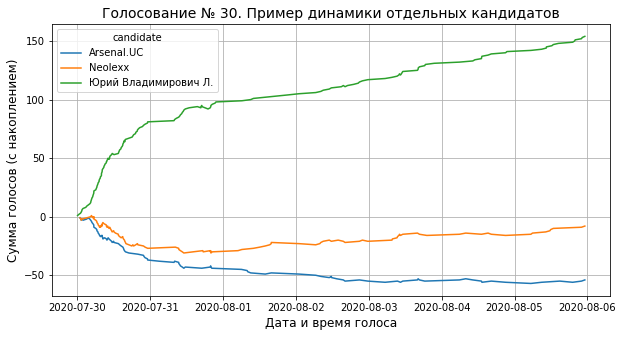

In [35]:
plt.figure(figsize=(10, 5))
plt.title('Голосование № 30. Пример динамики отдельных кандидатов'.format(i), fontsize=14)
plt.xlabel('Дата и время голоса', fontsize=12)
plt.ylabel('Сумма голосов (с накоплением)', fontsize=12)
plt.grid(True)
sns.lineplot(data=df_test_plot.query('n == 30 & (candidate == "Arsenal.UC" | candidate == "Юрий Владимирович Л." | candidate == "Neolexx")') , x='time', y='cumsum', hue='candidate')
plt.show()

На данном примере видно, что в целом динамика первого дня - сохраняется. Если за кандиадата голосуют "за" или против, то в течении недели кандадат бужет сохранять "свою динамику". Бывают некоторые исключения, например кандидат Neolexx (голосование №30) при отрицательном голосовании первого дня в последующие 6 дней получал в основном положительные голоса. 

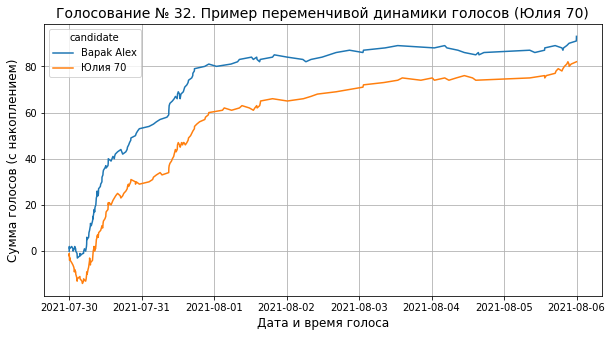

In [36]:
plt.figure(figsize=(10, 5))
plt.title('Голосование № 32. Пример переменчивой динамики голосов (Юлия 70)'.format(i), fontsize=14)
plt.xlabel('Дата и время голоса', fontsize=12)
plt.ylabel('Сумма голосов (с накоплением)', fontsize=12)
plt.grid(True)
sns.lineplot(data=df_test_plot.query('n == 32 & (candidate == "Юлия 70" | candidate == "Bapak Alex")') , x='time', y='cumsum', hue='candidate')
plt.show()

По данному графику видно, что есть некоторые случаи, когда "аутсайдер" первых часов голосования вырывается в лидеры к концу голосования.

Также на графике видно, что во второй день голосования данные кандидаты получили второй резкий "прирост" голосов. В следующие дни наблюдается так называемый "выход на плато", т.е. незначительный прирост голосов "за"

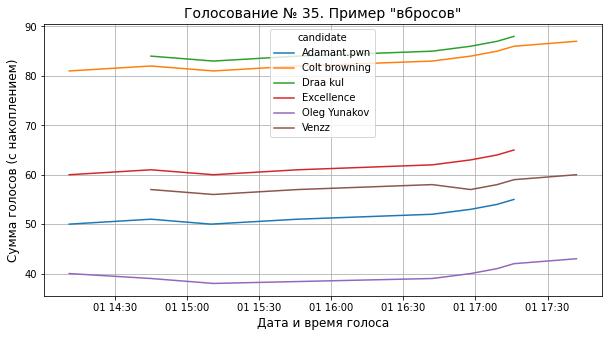

In [37]:
plt.figure(figsize=(10, 5))
plt.title('Голосование № 35. Пример "вбросов"'.format(i), fontsize=14)
plt.xlabel('Дата и время голоса', fontsize=12)
plt.ylabel('Сумма голосов (с накоплением)', fontsize=12)
plt.grid(True)
sns.lineplot(data=df_test_plot.query('n == 35 & (time < "2023-02-01 18:00:00" & time > "2023-02-01 14:00:00") & cumsum > 30') , x='time', y='cumsum', hue='candidate')
plt.show()

(см. также первый точечный график) В период с 15:00 до 18:00 1-го феравля 2023 г. в голосовании №35 для некоторых кандидатов (Draa kul, Colt Browing, Excellence, Adamant.pwn, Oleg Yunakov) наблюдается одинаковая динамика в росте голосов, отданых им. Возможно, в данный период произошло одновременное сознательное голосование "сторонников" данных кандидатов. Это одни и те же сторонники?

Рассмотрим данный случай отдельно

In [38]:
investigation_1 = df.query('n == 35')
investigation_1 = investigation_1.query('candidate == "Draa kul" | candidate == "Colt browning" | candidate == "Excellence" | candidate == "Adamant.pwn" | candidate == "Oleg Yunakov"')
investigation_1 = investigation_1.query('time < "2023-02-01 18:00:00" & time > "2023-02-01 14:00:00"')
investigation_1.pivot_table(index='user', columns='candidate', values='vote', aggfunc='sum')

candidate,Adamant.pwn,Colt browning,Draa kul,Excellence,Oleg Yunakov
user,,,,,
Alarmcrity,1.0,1.0,NaN,1.0,1.0
Alemann,1.0,1.0,1.0,1.0,1.0
Cantor,1.0,1.0,1.0,1.0,1.0
Farorud,1.0,1.0,1.0,1.0,1.0
Nahabino,1.0,1.0,1.0,1.0,1.0
Niklem,1.0,1.0,1.0,1.0,NaN
SfeoAC,-1.0,-1.0,-1.0,-1.0,-1.0
TomFord2,1.0,1.0,1.0,1.0,-1.0
Трифонов Андрей,NaN,1.0,NaN,NaN,1.0


In [39]:
investigation_1['user'].unique()

array(['Nahabino', 'Niklem', 'Cantor', 'Alemann', 'TomFord2', 'SfeoAC',
       'Farorud', 'Alarmcrity', 'Трифонов Андрей'], dtype=object)

Похоже на правду. Перечисленные в таблице пользователи в данный промежуток времени отдали одинаковое кол-во голосов одним и тем же кандадатам. Также в данном примере выявлен один "хейтер", который всем 5-ти лидерам голосования поставил отрицательный голос.

Без конкретного понимания системы голосования в Википедии каких-либо выводов, кроме того, что был осуществлен "вброс" голосов сделать нельзя (почему одни и те же пользователи голосуют за разных кандидатов в один и тот же преиод времени - загадка, возможно такая механика голосования).

В тоже время можно предположить, что  кандидаты Adamant.pwn, Colt browning, Draa kul, Excellence, Oleg Yunakov входят в одну "сетку" с пользователями 'Nahabino', 'Niklem', 'Cantor', 'Alemann', 'TomFord2', 'Farorud', 'Alarmcrity', 'Трифонов Андрей'. А пользователь 'SfeoAC' - из конкурирующей группировки

Рассмотрим другой пример

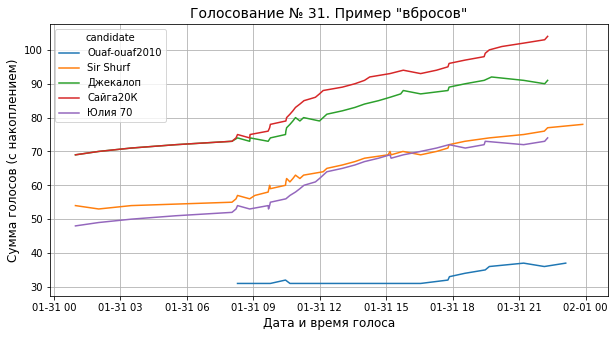

In [40]:
plt.figure(figsize=(10, 5))
plt.title('Голосование № 31. Пример "вбросов"'.format(i), fontsize=14)
plt.xlabel('Дата и время голоса', fontsize=12)
plt.ylabel('Сумма голосов (с накоплением)', fontsize=12)
plt.grid(True)
sns.lineplot(data=df_test_plot.query('n == 31 & (time < "2021-01-31 23:59:59" & time > "2021-01-31 00:00:00") & cumsum > 30') , x='time', y='cumsum', hue='candidate')
plt.show()

In [41]:
investigation_2 = df.query('n == 31')
investigation_2 = investigation_2.query('candidate == "Сайга20К" | candidate == "Sir Shurf" | candidate == "Юлия 70"')
investigation_2 = investigation_2.query('time < "2021-01-31 23:00:00" & time > "2021-01-31 09:00:00"')
investigation_2.pivot_table(index='user', columns='candidate', values='vote', aggfunc='sum')

candidate,Sir Shurf,Сайга20К,Юлия 70
user,,,
A.Morgunovskaya,1.0,1.0,NaN
Anikonets,1.0,NaN,NaN
Anton.G.wiki,1.0,1.0,NaN
Bapak Alex,NaN,1.0,1.0
CheloVechek,1.0,1.0,1.0
DR,1.0,1.0,1.0
Dmitry SM,1.0,1.0,1.0
Draa kul,1.0,1.0,-1.0
Dubrus,1.0,1.0,NaN


В рассматриваемый период по крайней мере 3 кандидата "подозрительно" одинаково набирают голоса. И явным образом выделяются пользователи, которые проголосовали одинаково за всех кандидатов

#### 4.2 Посмотрим на динамику суммы голосов в день

In [42]:
# добавим столбец с днем голосования
df['date'] = pd.to_datetime(df['time']).dt.date
df_test['date'] =  pd.to_datetime(df_test['time']).dt.date

In [43]:
df_test_plot_2 = df_test.groupby(['candidate', 'date', 'n']).agg({'vote' : 'sum'})
#df_test_plot['cumsum'] = df_test_plot.groupby(['candidate', 'n'])['vote'].cumsum()

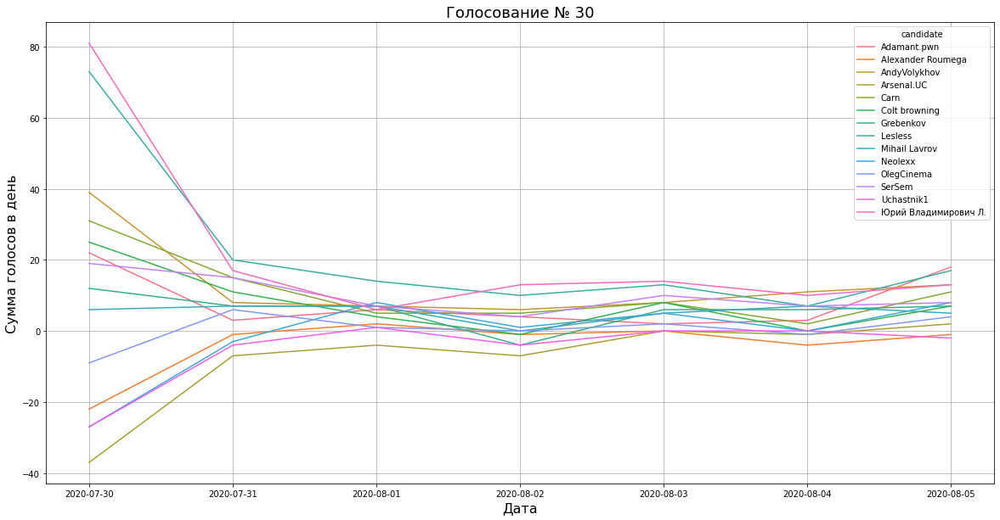

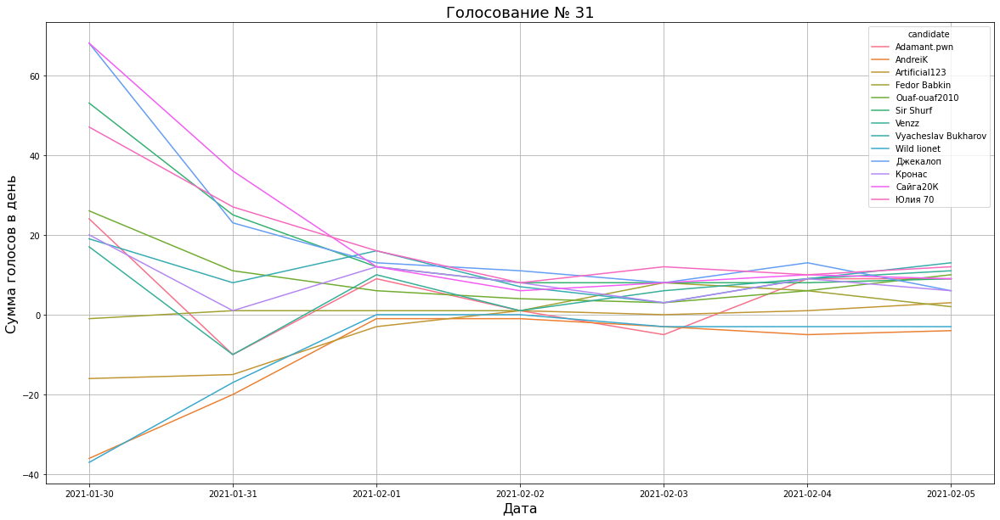

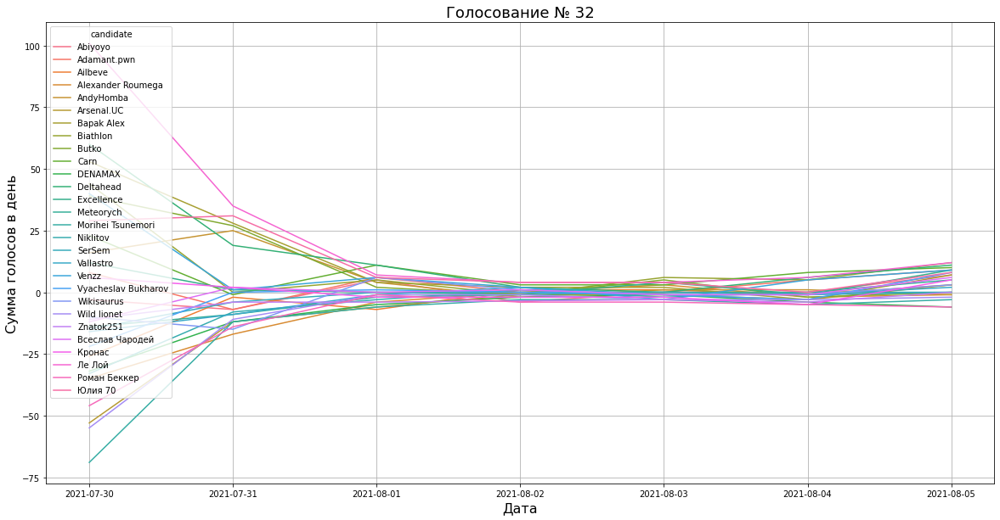

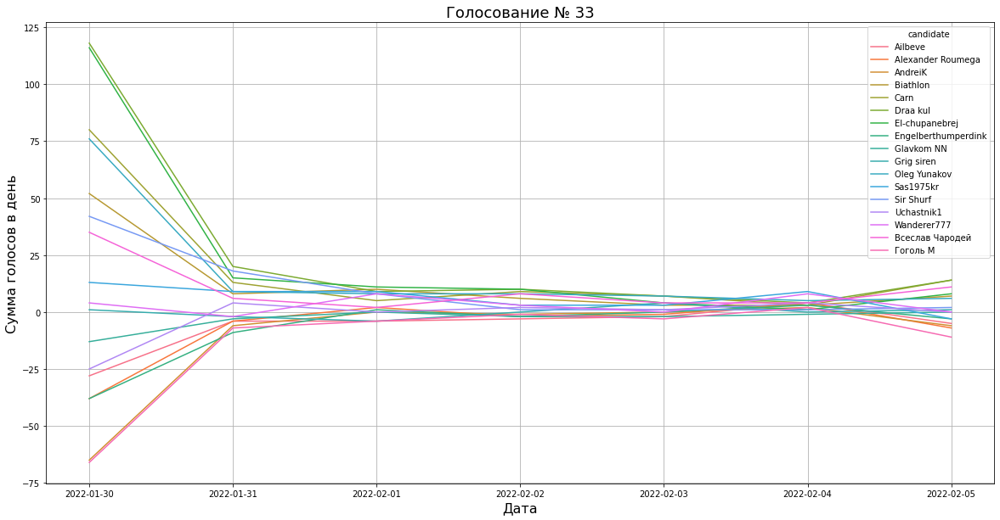

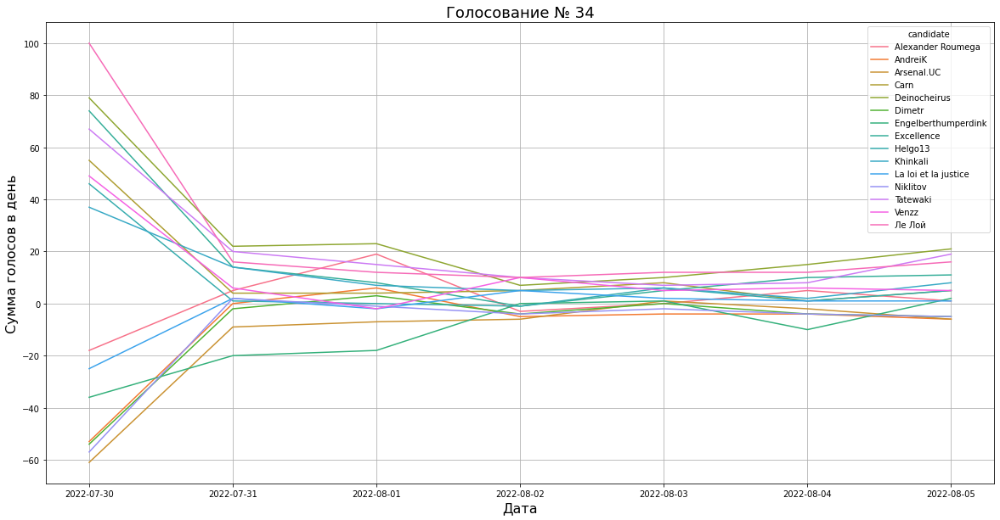

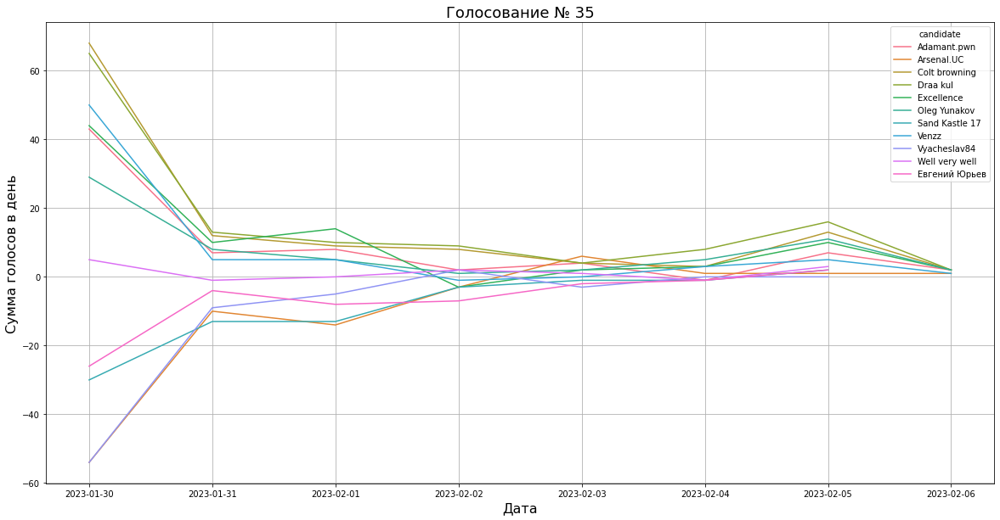

In [44]:
for i in vote_num:
    plt.figure(figsize=(20, 10))
    plt.title('Голосование № {}'.format(i), fontsize=18)
    plt.xlabel('Дата', fontsize=16)
    plt.ylabel('Сумма голосов в день', fontsize=16)
    plt.grid(True)
    sns.lineplot(data=df_test_plot_2.query('n == @i'), x='date', y='vote', hue='candidate', markers=True)
    plt.show()

Дополнительно наглядно подтверждаем вывод, что основное голосование происходит в первый день

<div class="alert alert-block alert-info"> <b>Comment</b> <a class="tocSkip"></a>
верно Ворзможно построение этих графиков избыточно - перед ними ты построил графики которые однозначно подтверждаю твой вывод об активности пользователей в первый день
</div>

#### 4.3 "Популярность" кандидатов

4.3.1 В разрезе голосований

Количество положительных и отрицательных голосов за каждого кандидата в разрезе голосований и расчет отношения голосов 

In [45]:
pop_candidates = df.pivot_table(index={'n','candidate'}, columns='vote_category', values='user', aggfunc='count').reset_index()
pop_candidates['ratio'] = pop_candidates['yes'] / pop_candidates['no']
pop_candidates.sort_values(by='ratio', ascending=False).style.background_gradient(cmap='Blues', axis=0)


vote_category,candidate,n,no,yes,ratio
97,Юрий Владимирович Л.,30,10,164,16.400000
94,Сайга20К,31,11,160,14.545455
50,Lesless,30,19,173,9.105263
35,Draa kul,33,24,206,8.583333
95,Юлия 70,31,19,151,7.947368
87,Джекалоп,31,24,166,6.916667
91,Ле Лой,32,30,199,6.633333
32,Deinocheirus,34,38,215,5.657895
67,Tatewaki,34,33,179,5.424242
65,Sir Shurf,31,32,155,4.843750


В данном и последующих таблицах и графиках под популярностью понимается не "общее кол-во голосов" за кандидата как в классических выборах на плебисцитах, где нет "отричательных" голосов, а отношение голосов за к голосам против. Больше похоже на гладиаторские поединки=)

In [46]:
display(pop_candidates['yes'].max())
display(pop_candidates['no'].max())

231

152

В классических выборах победил бы Ле Лой, а а золотую малину получил бы Engelberthumperdink.

Максимальное количество голосов "за", отданных за кандидата, составляет 231 голос (кандидат Ле Лой, голосование №34), максимальное количество голосов "нет" - 152 (кандидат Engelberthumperdink, голосование №34)

4.3.2 В целом

Количество положительных и отрицательных голосов за каждого кандидата и расчет отношения голосов

Данная таблица (а также следующая) показывает общие "предпочтения" голосующих пользователей относительно кандидатов. Отношение ratio явялется характеристикой того, во сколько раз сторонников данного кандадата больше его противников в каждом голосовании (а также в целом см. след. таблицу). 

In [47]:
pop_candidates_gen = pop_candidates.groupby('candidate').agg({'n': 'nunique', 'no' : 'sum', 'yes' : 'sum', 'ratio' : 'mean'}).sort_values(by='ratio', ascending=False).reset_index()
print('в данной таблице n - количество участий в голосованиях')
pop_candidates_gen.style.background_gradient(cmap='Blues', axis=0)

в данной таблице n - количество участий в голосованиях


vote_category,candidate,n,no,yes,ratio
0,Юрий Владимирович Л.,1,10,164,16.400000
1,Сайга20К,1,11,160,14.545455
2,Lesless,1,19,173,9.105263
3,Джекалоп,1,24,166,6.916667
4,Draa kul,2,58,367,6.659314
5,Deinocheirus,1,38,215,5.657895
6,Ле Лой,2,83,430,5.495912
7,Tatewaki,1,33,179,5.424242
8,Юлия 70,2,81,295,5.134975
9,El-chupanebrej,1,43,208,4.837209


In [48]:
pop_candidates_gen['n'].value_counts()

1    40
2    16
4     5
3     2
Name: n, dtype: int64

Из 62 кандидатов участвовали в голосовании:

40 кандидатов 1 раз;
16 - 2 раза;
2 - 3 раза;
5 - 4 раза.

In [49]:
pop_candidates_gen['candidate'].head(10).unique()

array(['Юрий Владимирович Л.', 'Сайга20К', 'Lesless', 'Джекалоп',
       'Draa kul', 'Deinocheirus', 'Ле Лой', 'Tatewaki', 'Юлия 70',
       'El-chupanebrej'], dtype=object)

In [50]:
pop_candidates_gen['candidate'].tail(10).unique()

array(['Niklitov', 'Sand Kastle 17', 'Vyacheslav84', 'AndreiK',
       'Arsenal.UC', 'DENAMAX', 'Роман Беккер', 'Гоголь М', 'Wild lionet',
       'Morihei Tsunemori'], dtype=object)

Таким образом, 10-ть кандидатов, имеющие наибольшую поддержку (т.е. значительное превосходство "лайкеров" над "хейтерами"), являются: 

 - 'Юрий Владимирович Л.', 'Сайга20К', 'Lesless', 'Джекалоп', Draa kul', 'Deinocheirus', 'Ле Лой', 'Tatewaki', 'Юлия 70', El-chupanebrej'

10-ть кандидатов, имеющие наименьшую поддержку, являются:

- 'Niklitov', 'Sand Kastle 17', 'Vyacheslav84', 'AndreiK', 'Arsenal.UC', 'DENAMAX', 'Роман Беккер', 'Гоголь М', 'Wild lionet', 'Morihei Tsunemori'

Используя "классический" выборный подход можно назвать самых популярных и непопулярных кандидатов в "истории":

In [51]:
display(pop_candidates_gen.sort_values(by='yes', ascending=False).head(10))
display(pop_candidates_gen.sort_values(by='no').tail(10))

vote_category,candidate,n,no,yes,ratio
18,Carn,4,263,610,2.406512
23,Venzz,4,257,508,1.984741
6,Ле Лой,2,83,430,5.495912
24,Adamant.pwn,4,236,424,1.845971
4,Draa kul,2,58,367,6.659314
17,Excellence,3,138,365,2.714494
12,Sir Shurf,2,120,316,3.336648
16,Oleg Yunakov,2,114,296,2.827383
8,Юлия 70,2,81,295,5.134975
20,Biathlon,2,133,293,2.208333


vote_category,candidate,n,no,yes,ratio
48,Ailbeve,2,163,90,0.549907
61,Wild lionet,2,177,38,0.214497
53,Niklitov,2,203,87,0.416508
24,Adamant.pwn,4,236,424,1.845971
23,Venzz,4,257,508,1.984741
18,Carn,4,263,610,2.406512
49,Engelberthumperdink,2,268,139,0.526656
56,AndreiK,3,342,130,0.362963
45,Alexander Roumega,4,363,243,0.672972
57,Arsenal.UC,4,422,133,0.312603


4.3.3 Общее распределение голосов по голосаваниям

In [52]:
n_vote = pop_candidates.groupby('n').agg({'candidate' : 'nunique', 'no' : 'sum', 'yes' : 'sum'}).reset_index()
n_vote['ratio'] = n_vote['yes'] / n_vote['no']
n_vote

vote_category,n,candidate,no,yes,ratio
0,30,14,713,1328,1.862553
1,31,13,581,1264,2.175559
2,32,28,2012,2158,1.072565
3,33,17,1409,1965,1.394606
4,34,15,1382,1921,1.390014
5,35,11,817,1111,1.359853


In [53]:
print(n_vote['ratio'].mean(), n_vote['ratio'].median())

1.5425250473249594 1.3923102876998086


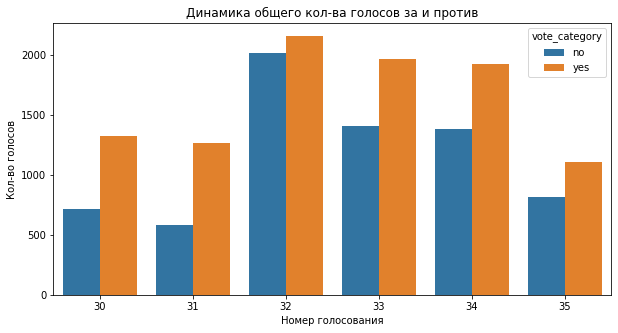

In [54]:
plt.figure(figsize=(10,5))
sns.barplot(data=df.pivot_table(index={'n', 'vote_category'},
                                            values='user', aggfunc='count').reset_index(),
                                            x='n', y='user', hue='vote_category')
plt.title('Динамика общего кол-ва голосов за и против')
plt.xlabel('Номер голосования')
plt.ylabel('Кол-во голосов')
plt.show()

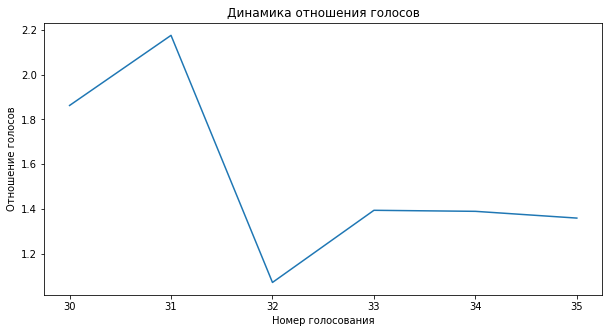

In [55]:
plt.figure(figsize=(10,5))
sns.lineplot(data=n_vote, x='n', y='ratio')
plt.title('Динамика отношения голосов')
plt.xlabel('Номер голосования')
plt.ylabel('Отношение голосов')
plt.show()

Стоит отметить, что в голосовании №32 что-то случилось, т.к. количество голосов за и против всех кандидатов практически сравнялось. Вот это была заруба, наверное

#### 4.4 Голосования

В таблице представлена информация о сумме голосов, которые отдавали пользователи каждому из кандидатов (в следующей таблице аналогичные данные с подсчетом количества кандидатов, за которых голосовал пользователь)

In [56]:
cand_matrix = df.pivot_table(index={'is_candidate','user'}, columns='candidate', values='vote', aggfunc='sum').reset_index()
cand_matrix = cand_matrix.assign(total=cand_matrix.sum(axis=1)).sort_values(by='total', ascending=False)
cm_sum = cand_matrix[['user', 'is_candidate', 'total']]
cand_matrix.style.background_gradient(cmap='Blues', axis=0)

C:\Users\Utilisateur\AppData\Local\Temp\ipykernel_38472\1424039225.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  cand_matrix = cand_matrix.assign(total=cand_matrix.sum(axis=1)).sort_values(by='total', ascending=False)


In [57]:
cand_matrix_count = cand_matrix.assign(total=cand_matrix.count(axis=1))
cand_matrix_count = cand_matrix_count.rename(columns={'total' : 'count'})
cm_count = cand_matrix_count[['user', 'count']]
cand_matrix_count.style.background_gradient(cmap='Blues', axis=0)

Из таблиц, кроме общих сведений о том, кто за кого и как голосовал, видно также, что некоторые пользователи, являясь кандидатами голосуют за себя активно, а для некоторых это "харам". Например, кандидат Arsenal.UC отдал сам себе 4 голоса, а Юрий Владимирович Л за себя ни разу не проголосовал. Кандидат Cam голосовал за себя так, что суммарное кол-во голосов во всех голосованиях равно 0. Странная тусовка собралась тут в Википедии.

Также явным образом выделяются кандитаты, которые голосуют в массе положительно практически за всех кандидатов во всех голосованиях (Arsenal, ЮВЛ).Также есть пользователи, которые голосуют всегда против всех

Немного другой разрез (по голосованиям)

In [58]:
vote_matrix = df.pivot_table(index='user', columns={'n','vote_category'}, values='vote', aggfunc='sum').reset_index()
vote_matrix = vote_matrix.assign(total=vote_matrix.sum(axis=1)).sort_values(by='total', ascending=False)
vote_matrix.style.background_gradient(cmap='Reds', axis=0)

C:\Users\Utilisateur\AppData\Local\Temp\ipykernel_38472\1140720396.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  vote_matrix = vote_matrix.assign(total=vote_matrix.sum(axis=1)).sort_values(by='total', ascending=False)


<div class="alert alert-block alert-info"> <b>Comment</b> <a class="tocSkip"></a>
    
и какой вывод мы можем сделать из этой таблицы?
</div>

#### 4.4.1 Совместим данные

In [59]:
cm = cm_sum.merge(cm_count, on='user', how='left')
cm['votes_per_vote'] = cm['total'] / cm['count']
cm.sort_values(by='votes_per_vote', ascending=False)

candidate,user,is_candidate,total,count,votes_per_vote
3,Юрий Владимирович Л.,yes,54.0,41,1.317073
28,Kvaziko-spb,no,30.0,23,1.304348
4,Полиционер,no,54.0,43,1.255814
5,Alemann,no,51.0,42,1.214286
20,Андрей Лишанский,no,35.0,29,1.206897
...,...,...,...,...,...
694,Dubrovin S.,no,-40.0,48,-0.833333
696,Kolchak1923,no,-60.0,66,-0.909091
691,Qh13,no,-36.0,34,-1.058824
695,DZ,no,-46.0,40,-1.150000


В данной таблице представлено общее отношение отданных голосов за кандидатов. Т.е. пользователь "Полиционер" в среднем голосует за кандидата своим 1,25 голосом во всех голосованиях. А пользователь Qh13 голосует всегда против всех.

Таким образом можно дополнительно сегментировать пользователей (только тех, кто голосует) по признаку отношения кол-ва их положительных и отрицательных голосов

Например, сегмент голосующих практически всегда за:

In [60]:
cm.query('votes_per_vote >= 1')['user'].tolist()

['Arsenal.UC',
 'Ibidem',
 'Юрий Владимирович Л.',
 'Полиционер',
 'Alemann',
 'Ssr',
 'Excellence',
 'Никонико962',
 'Ghuron',
 'Saramag',
 'Андрей Лишанский',
 'Kvaziko-spb',
 'Кирилл С1',
 'Vyacheslav84',
 'AlexUser777',
 'AndyHomba',
 'Noel baran',
 'Klip game']

#### 5.4.2 Как голосуют кандидаты

In [61]:
cand_cand_matrix = df.pivot_table(index={'is_candidate','user'}, columns='candidate', values='vote', aggfunc='sum').reset_index()
cand_cand_matrix.query('is_candidate == "yes"').style.background_gradient(cmap='Reds')

candidate,user,is_candidate,Abiyoyo,Adamant.pwn,Ailbeve,Alexander Roumega,AndreiK,AndyHomba,AndyVolykhov,Arsenal.UC,Artificial123,Bapak Alex,Biathlon,Butko,Carn,Colt browning,DENAMAX,Deinocheirus,Deltahead,Dimetr,Draa kul,El-chupanebrej,Engelberthumperdink,Excellence,Fedor Babkin,Glavkom NN,Grebenkov,Grig siren,Helgo13,Khinkali,La loi et la justice,Lesless,Meteorych,Mihail Lavrov,Morihei Tsunemori,Neolexx,Niklitov,Oleg Yunakov,OlegCinema,Ouaf-ouaf2010,Sand Kastle 17,Sas1975kr,SerSem,Sir Shurf,Tatewaki,Uchastnik1,Vallastro,Venzz,Vyacheslav Bukharov,Vyacheslav84,Wanderer777,Well very well,Wikisaurus,Wild lionet,Znatok251,Всеслав Чародей,Гоголь М,Джекалоп,Евгений Юрьев,Кронас,Ле Лой,Роман Беккер,Сайга20К,Юлия 70,Юрий Владимирович Л.
10,Abiyoyo,yes,nan,2.000000,1.000000,-1.000000,1.000000,-1.000000,nan,0.000000,nan,-1.000000,1.000000,-1.000000,2.000000,1.000000,nan,-1.000000,1.000000,nan,1.000000,nan,1.000000,2.000000,nan,nan,nan,nan,1.000000,1.000000,nan,nan,1.000000,nan,-1.000000,nan,1.000000,1.000000,nan,nan,nan,nan,1.000000,nan,nan,nan,1.000000,3.000000,-1.000000,nan,nan,nan,nan,nan,-1.000000,1.000000,nan,nan,1.000000,-1.000000,1.000000,1.000000,nan,-1.000000,nan
12,Adamant.pwn,yes,nan,nan,-1.000000,-2.000000,-2.000000,-1.000000,1.000000,-1.000000,nan,nan,0.000000,-1.000000,1.000000,2.000000,nan,nan,1.000000,-1.000000,1.000000,nan,-1.000000,nan,nan,-1.000000,nan,-1.000000,nan,nan,-1.000000,1.000000,nan,nan,-1.000000,nan,-1.000000,1.000000,nan,1.000000,nan,nan,nan,-1.000000,nan,-1.000000,nan,3.000000,nan,nan,-1.000000,nan,nan,nan,nan,2.000000,-1.000000,nan,nan,2.000000,2.000000,nan,nan,nan,1.000000
17,Ailbeve,yes,1.000000,1.000000,nan,nan,nan,nan,nan,-1.000000,-1.000000,nan,2.000000,nan,4.000000,0.000000,nan,1.000000,nan,nan,0.000000,1.000000,-2.000000,0.000000,nan,-1.000000,nan,-1.000000,1.000000,-1.000000,1.000000,1.000000,nan,nan,nan,1.000000,nan,0.000000,1.000000,1.000000,-1.000000,-1.000000,nan,0.000000,nan,2.000000,1.000000,1.000000,2.000000,-1.000000,-1.000000,-1.000000,1.000000,-1.000000,nan,nan,nan,nan,-1.000000,nan,2.000000,nan,nan,1.000000,nan
26,Alexander Roumega,yes,nan,1.000000,nan,nan,nan,nan,nan,1.000000,nan,nan,nan,nan,1.000000,1.000000,nan,1.000000,nan,nan,1.000000,nan,nan,1.000000,nan,nan,nan,nan,nan,nan,1.000000,nan,nan,nan,nan,nan,nan,1.000000,nan,nan,nan,nan,nan,nan,1.000000,nan,nan,1.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.000000,nan,nan,nan,nan
36,AndreiK,yes,nan,1.000000,1.000000,2.000000,3.000000,nan,nan,1.000000,1.000000,nan,-1.000000,nan,-2.000000,nan,nan,-1.000000,nan,1.000000,1.000000,-1.000000,0.000000,1.000000,-1.000000,1.000000,nan,1.000000,1.000000,1.000000,-1.000000,nan,nan,nan,nan,nan,1.000000,1.000000,nan,1.000000,nan,1.000000,nan,-2.000000,1.000000,1.000000,nan,0.000000,1.000000,nan,-1.000000,nan,nan,-1.000000,nan,1.000000,1.000000,1.000000,nan,1.000000,1.000000,nan,1.000000,1.000000,nan
39,AndyHomba,yes,nan,1.000000,nan,nan,1.000000,nan,nan,nan,nan,nan,nan,1.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.000000,nan,1.000000,nan,nan,nan,nan,1.000000,nan,1.000000,nan,1.000000,nan,nan,nan,1.000000,nan,nan,1.000000,1.000000,nan,nan,nan,1.000000,2.000000,nan,nan,nan,1.000000,nan,1.000000,1.000000,nan,1.000000,nan,2.000000,nan,nan,1.000000,2.000000,1.000000
40,AndyVolykhov,yes,-1.000000,4.000000,nan,-4.000000,-3.000000,-1.000000,nan,-4.000000,-1.000000,1.000000,2.000000,-1.000000,4.000000,2.000000,-1.000000,1.000000,1.000000,-1.000000,2.000000,1.000000,-2.000000,2.000000,nan,-1.000000,1.000000,-1.000000,nan,1.000000,-1.000000,1.000000,1.000000,-1.000000,-1.000000,-1.000000,-2.000000,0.000000,-1.000000,nan,-1.000000,-1.000000,-1.000000,1.000000,1.000000,-1.000000,1.000000,3.000000,-1.000000,-1.000000,-1.000000,1.000000,nan,-2.000000,nan,-1.000000,-1.000000,1.000000,nan,-2.000000,2.000000,1.000000,1.000000,2.000000,1.000000
52,Arsenal.UC,yes,-1.000000,3.000000,0.000000,4.000000,2.000000,1.000000,-1.000000,4.000000,nan,1.000000,2.000000,1.000000,2.000000,2.000000,1.000000,1.00000

In [62]:
is_cand_vote = df.pivot_table(index={'n', 'is_candidate'}, columns='vote_category', values='user', aggfunc='count').reset_index()
is_cand_vote['ratio'] = is_cand_vote['yes'] / is_cand_vote['no']
is_cand_vote.style.background_gradient(cmap='Blues', axis=0)

vote_category,n,is_candidate,no,yes,ratio
0,30,no,627,1078,1.719298
1,30,yes,86,250,2.906977
2,31,no,505,1029,2.037624
3,31,yes,76,235,3.092105
4,32,no,1736,1726,0.994240
5,32,yes,276,432,1.565217
6,33,no,1219,1656,1.358491
7,33,yes,190,309,1.626316
8,34,no,1235,1656,1.340891
9,34,yes,147,265,1.802721


Данные отношения голосов показывают, что пользователи-кандидаты чаще голосуют положительно за других кандидатов. Например, в голосованиях №30-31 пользователи-кандидаты отдали в 3 раза больше положительных голосов другим кандидататм, в то время как обычне пользователи только в 2 раза.

В графическом виде:

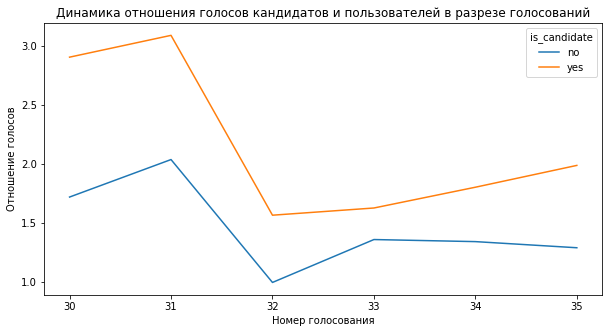

In [63]:
plt.figure(figsize=(10,5))
sns.lineplot(data=is_cand_vote, x='n', y='ratio', hue='is_candidate')
plt.title('Динамика отношения голосов кандидатов и пользователей в разрезе голосований')
plt.xlabel('Номер голосования')
plt.ylabel('Отношение голосов')
plt.show()

### 5 Сети кандидатов

Рассмотрим общее распределение голосов и составим функцию, возвращающую списки пользователей, которые поддерживают или не поддерживают кандидата

In [64]:
#создадим датафремй с общими оценками всех юзеров за каждого кандидата
total_net = df.pivot_table(index={'user', 'candidate'}, values='vote', aggfunc='sum').reset_index().sort_values(by='vote')
total_net

,user,candidate,vote
1838,CheloVechek,Arsenal.UC,-4
5266,Kolchak1923,Arsenal.UC,-4
1364,Biathlon,Alexander Roumega,-4
10220,Vladimir Solovjev,Alexander Roumega,-4
5260,Kolchak1923,Adamant.pwn,-4
...,...,...,...
7599,Putnik,Carn,4
9394,Swarrel,Adamant.pwn,4
456,Alex fand,Carn,4
10667,Wikisaurus,Carn,4


In [65]:
def cand_network(name):
    #users = df['user'].unique().tolist()
    cand_megasupp = total_net.query('candidate == @name and vote > 2')[['user', 'vote']]  # или ['user'].unique().tolist()
    cand_megaopp = total_net.query('candidate == @name and vote < -2')[['user', 'vote']]
    cand_supp = total_net.query('candidate == @name and (vote <= 2 and vote >= 1)')[['user', 'vote']]
    cand_opp = total_net.query('candidate == @name and (vote >= -2 and vote <= -1)')[['user', 'vote']]   
    cand_ind = total_net.query('candidate == @name and vote == 0')[['user', 'vote']]
    #for i in cand_supp:
    #    if i in users:
    #        cand_ind = users.remove(i)
    #for j in cand_opp:
    #    if i in cand_ind:
    #        cand_ind = cand_ind.remove(i)
    
    return cand_megasupp, cand_megaopp, cand_supp, cand_opp, cand_ind

In [66]:
cand_network('Carn')

(               user  vote
 2281   Deinocheirus     3
 1954      Cozy Glow     3
 10065         Venzz     3
 7641    Q-bit array     3
 2044             DR     3
 ...             ...   ...
 6283       Michgrig     4
 7599         Putnik     4
 456       Alex fand     4
 10667    Wikisaurus     4
 8711        Sigwald     4
 
 [73 rows x 2 columns],
                   user  vote
 12115            Клайв    -4
 4623        Inctructor    -4
 4066       Helga Regin    -4
 9526            Tempus    -4
 2692         Dmartyn80    -4
 2659              Dlom    -4
 237             Adavyd    -4
 10643         Wikifido    -3
 13085      Тара-Амингу    -3
 4495             Igrek    -3
 663          Andreykor    -3
 10774          Wulfson    -3
 2119   Daphne mesereum    -3
 5224          Kmorozov    -3,
                       user  vote
 9259         Stormare.henk     1
 10457               Vvk121     1
 1819               Cchrx23     1
 1207             Balabinrm     1
 10470  Vyacheslav Bukharov  

Таким обзаом данная функция позволяет отсортировать всех голосующих за определенного кандидата по 5 группам:
- термоядреный электорат - те, кто прогосовал за кандидата 3 и более раз голосом "за"
- термоядерная оппозиция - те, кто проголосовал за кандидата 3 и более раза голосом "против"
- сторонники - те, кто проголосовал за кандидата 1,2 раза "за" (а может быть и 1 раз против)
- противники - те, кто проголосовал за кандидата 1,2 раза "против" (а может быть и 1 раз за)
- индиффирентные - те, кто не голосовал за кандидата.

Как видно из кода, для кандадатов, кто принимал участие в голосованиях 1 или 2 раза, функция не определит термоядернный элеткроат и оппозицию. В целом это логично. Кандидат участововал в голосваниях мало, пока появились только сторонники и противники, которые 1-2 раза голосовали когда-то за кандидата.

А в данном примере кандидат Carn - ветеран голосований, имеющий группу из 73 пользователей, которые "давно" за него голосуют.

**Обладая дополнительными навыками в целом можно было бы построить направленный граф кандидат-пользователь, который после упаковки позволил бы визуализировать всю сеть голосующих**. Например, https://i.yapx.ru/WBgXP.pnН - недоуложенный граф "кандидат-юзер", выполненный в Gephi

Но осуществим попытку! (подсмотрим в интернете https://colab.research.google.com/github/dm-fedorov/pandas_basic/blob/master/%D0%B1%D1%8B%D1%81%D1%82%D1%80%D0%BE%D0%B5%20%D0%B2%D0%B2%D0%B5%D0%B4%D0%B5%D0%BD%D0%B8%D0%B5%20%D0%B2%20pandas/graph-viz/%D0%94%D0%B5%D0%BB%D0%B0%D0%B5%D0%BC%20%D1%81%D0%B5%D1%82%D0%B5%D0%B2%D1%8B%D0%B5%20%D0%B3%D1%80%D0%B0%D1%84%D1%8B%20%D0%B8%D0%BD%D1%82%D0%B5%D1%80%D0%B0%D0%BA%D1%82%D0%B8%D0%B2%D0%BD%D1%8B%D0%BC%D0%B8%20%D1%81%20%D0%BF%D0%BE%D0%BC%D0%BE%D1%89%D1%8C%D1%8E%20Python%20%D0%B8%20Pyvis.ipynb)

In [67]:
net = df.pivot_table(index={'candidate', 'user'}, columns='n', values='vote', aggfunc='sum').reset_index().fillna(0)
net = net.sort_values(by='candidate')
net['total'] = net[[30, 31, 32, 33, 34, 35]].sum(axis=1)
net = net.rename(columns = {30 : 'v30', 31 : 'v31', 32 : 'v32', 33 : 'v33', 34 : 'v34', 35 : 'v35'})
net

n,user,candidate,v30,v31,v32,v33,v34,v35,total
2109,Daphne mesereum,Abiyoyo,0.0,0.0,-1.0,0.0,0.0,0.0,-1.0
12613,Олег07,Abiyoyo,0.0,0.0,-1.0,0.0,0.0,0.0,-1.0
4325,Ibidem,Abiyoyo,0.0,0.0,-1.0,0.0,0.0,0.0,-1.0
4379,Icannotyet,Abiyoyo,0.0,0.0,-1.0,0.0,0.0,0.0,-1.0
10820,Xplt,Abiyoyo,0.0,0.0,1.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...
13072,Старушка Марселина,Юрий Владимирович Л.,1.0,0.0,0.0,0.0,0.0,0.0,1.0
5442,Krokodil89,Юрий Владимирович Л.,1.0,0.0,0.0,0.0,0.0,0.0,1.0
8898,Skorp24,Юрий Владимирович Л.,1.0,0.0,0.0,0.0,0.0,0.0,1.0
2001,D.Nutoff,Юрий Владимирович Л.,1.0,0.0,0.0,0.0,0.0,0.0,1.0


In [68]:
pip install pyvis.network

     -------------------------------------- 49.6/49.6 KB 418.3 kB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [69]:
pip install pyvis

     -------------------------------------- 756.0/756.0 KB 1.2 MB/s eta 0:00:00
     -------------------------------------- 40.5/40.5 KB 480.4 kB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [70]:
from pyvis.network import Network

net_test = Network(height='750px',
                  width='100%',
                  bgcolor='#222222',
                  font_color='white',
                  notebook=True)

net_test.barnes_hut()
data = net.query('candidate == "Adamant.pwn" | candidate == "Arsenal.UC"')

sources = data['user']
targets = data['candidate']
weights = data['v30']

edge_data = zip(sources, targets, weights)

for e in edge_data:
    src = e[0]
    dst = e[1]
    w = e[2]

    net_test.add_node(src, src, title=src)
    net_test.add_node(dst, dst, title=dst)
    net_test.add_edge(src, dst, value=w)

neighbor_map = net_test.get_adj_list()

net_test.show('adamant.html')

adamant.html


Нууу, допустим)) Научиться бы еще расскаршивать и всячески украшать такие графы....

Но в целом видно, что есть пользователи, кто голосовал за обоих кандидатов, кто только за одного. 

### 6.1 Попыта кластеризации №1

далее по учебнику. Протестируем на нескольких параметрах, применим алгоритм кластеризации k-means

In [71]:
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

In [72]:
#выбираем атрибуты для кластеризации
features = wiki_stat[['months',
                      'avgtime',
                      'article_in_month',
                      'pages_in_month',
                      'edit_volume',
                      'logs_per_min']]

In [73]:
#features.fillna(0, inplace=True)

In [74]:
# стандартизация признаков
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

In [75]:
# кластеризация данных
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(features_scaled)

KMeans(n_clusters=3, random_state=42)

In [76]:
display(features_scaled)

array([[-0.80485069, 12.59939289, 18.8372651 , 51.75265205, -0.89834114,
        -0.19603649],
       [ 0.20919425,  5.58818923, -0.24410739,  3.52591896, -0.32338878,
         4.81722355],
       [ 0.60354506,  9.09379106,  4.81750452,  1.67077208, -0.57783679,
         1.51465927],
       ...,
       [-1.59355231, -0.83874747, -0.26400996, -0.11691828, -0.47474126,
        -0.41492945],
       [-1.70622397, -1.2769477 , -0.26400996, -0.11777652, -0.69485166,
        -0.33209073],
       [-1.70622397, -1.2769477 , -0.26400996, -0.11777652, -0.76572509,
        -0.42130166]])

In [77]:
# метки кластеров
labels = kmeans.labels_
labels

array([1, 2, 2, ..., 2, 2, 2])

In [78]:
features['cluster'] = labels

C:\Users\Utilisateur\AppData\Local\Temp\ipykernel_38472\1494838440.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  features['cluster'] = labels


In [79]:
# ошибка повторится
features2 = features.loc[:, 'cluster']
features2['cluster'] = labels

C:\Users\Utilisateur\AppData\Local\Temp\ipykernel_38472\2768385368.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  features2['cluster'] = labels
C:\Users\Utilisateur\AppData\Local\Temp\ipykernel_38472\2768385368.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  features2['cluster'] = labels


In [80]:
#но столбец добавлен
features

,months,avgtime,article_in_month,pages_in_month,edit_volume,logs_per_min,cluster
0,49,480,372.714286,8634.000000,117.800559,0.016291,1
1,103,240,0.388350,606.504854,357.115841,0.378843,2
2,124,360,99.153226,297.709677,251.205679,0.140006,2
3,173,180,5.329480,171.554913,378.222942,0.034351,0
4,135,180,37.185185,217.874074,181.019926,0.048811,2
...,...,...,...,...,...,...,...
2823,17,30,1.352941,2.058824,298.586572,0.002720,2
2824,22,30,0.000000,0.136364,366.548043,0.000538,2
2825,7,20,0.000000,0.142857,294.117647,0.000461,2
2826,1,5,0.000000,0.000000,202.500000,0.006452,2


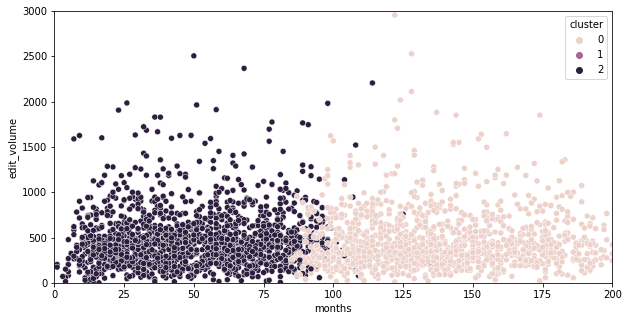

In [81]:
plt.figure(figsize=(10, 5))
sns.scatterplot(data=features, y='edit_volume', x='months', hue='cluster')
plt.ylim(0, 3000)
plt.xlim(0,200)
plt.show()

### 6.2 Попыта кластеризации №2

Попробуем использовать исходные данные и полученные из них "сегменты"/категории

In [82]:
features2 = wiki_stat[['edits_total',  
                       'edits_edits', 
                       'edits_articles',
                        'creations_pages',  
                        'creations_articles',
                        'texts_volume',
                        'logs', 
                        'months',  
                        'avgtime',      
                        'categorize_articles',
                        'categorize_pages', 
                        'categorize_avgtime',
                        'categorize_edit']]


Т.к. данный алогритм не принимает на вход ничего, кроме вещественных чисел, преобразуем категории в числа

In [83]:
pd.get_dummies(features2, columns=['categorize_articles', 'categorize_pages', 'categorize_avgtime', 'categorize_edit'], drop_first= True )

,edits_total,edits_edits,edits_articles,creations_pages,creations_articles,texts_volume,logs,months,avgtime,categorize_articles_B,categorize_articles_C,categorize_pages_B,categorize_pages_C,categorize_avgtime_B,categorize_avgtime_C,categorize_edit_B,categorize_edit_C
0,670625,658747,229189,423066,18263,79000000,11878,49,480,0,1,0,1,0,1,0,0
1,568443,278128,119067,62470,40,203000000,290315,103,240,0,0,0,1,0,1,1,0
2,461773,268027,226018,36916,12295,116000000,193746,124,360,0,1,0,1,0,1,0,0
3,372796,339636,269363,29679,922,141000000,33160,173,180,0,1,0,1,0,1,1,0
4,370125,333356,277881,29413,5020,67000000,36769,135,180,0,1,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2823,566,523,501,35,23,169000,43,17,30,0,0,0,0,1,0,1,0
2824,562,551,514,3,0,206000,11,22,30,0,0,0,0,1,0,1,0
2825,51,49,17,1,0,15000,2,7,20,0,0,0,0,0,0,1,0
2826,2,1,0,0,0,405,1,1,5,0,0,0,0,0,0,0,0


In [84]:
# стандартизация признаков
scaler = StandardScaler()
features2_scaled = scaler.fit_transform(features)
# кластеризация данных
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(features2_scaled)
#метки
labels = kmeans.labels_

features2['cluster'] = labels

C:\Users\Utilisateur\AppData\Local\Temp\ipykernel_38472\4274991623.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  features2['cluster'] = labels


In [85]:
features2

,edits_total,edits_edits,edits_articles,creations_pages,creations_articles,texts_volume,logs,months,avgtime,categorize_articles,categorize_pages,categorize_avgtime,categorize_edit,cluster
0,670625,658747,229189,423066,18263,79000000,11878,49,480,C,C,C,A,2
1,568443,278128,119067,62470,40,203000000,290315,103,240,A,C,C,B,1
2,461773,268027,226018,36916,12295,116000000,193746,124,360,C,C,C,A,1
3,372796,339636,269363,29679,922,141000000,33160,173,180,C,C,C,B,0
4,370125,333356,277881,29413,5020,67000000,36769,135,180,C,C,C,A,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2823,566,523,501,35,23,169000,43,17,30,A,A,B,B,1
2824,562,551,514,3,0,206000,11,22,30,None,A,B,B,1
2825,51,49,17,1,0,15000,2,7,20,None,A,A,B,1
2826,2,1,0,0,0,405,1,1,5,None,None,A,A,1


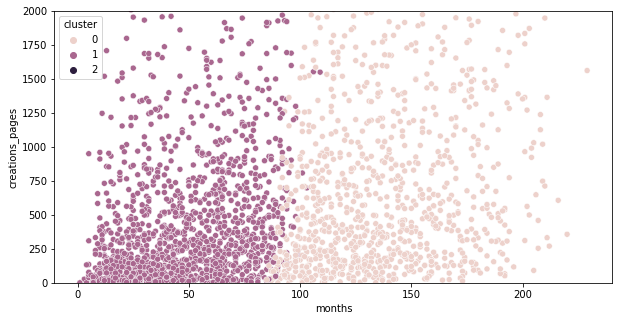

In [86]:
plt.figure(figsize=(10, 5))
sns.scatterplot(data=features2, y='creations_pages', x='months', hue='cluster')
plt.ylim(0, 2000)
#plt.xlim(0,2000)
plt.show()

Наблюдаем 2 аналогичные картины. Причем кластер №2 - 1 пользователь.

В целом данная кластеризация пользователей похожа на уже проведенную ранее сегментацию по средним значениям 

## Вывод

В рамках работы получены следующие основные результаты:

1) Проведена предварительная предобработка данных

2) Добавлены новые расчетные атрибуты в wiki_stat

3) Проведена сегментация пользователей по различным параметрам (количества созданных статей/страниц в месяц, общего времени, размера 1 изменения и т.д) и выявлены некоторые закономерности, например:
- пользователи, которые меньше всего проводят времени в википедии (это самый малочисленный сегмент) в среднем зарегистрированы дольше, чем более активные пользователи, и вносят за 1 раз больший объем правок, чем остальные пользователи, при этом в среднем создают меньше всего страниц и статей
- пользователи, которые вносят правки минимального объема вносят в количественном выражении больше всего правок и создают больше всего страниц, практически дольше всех остальных пользователей из других сегментов присутсвуют в википедии и совешают больше "входов/логов"

4) ВЫявлены некоторые корреляции:
- очень сильная корреляция (>0,9) наблюдается между атрибутами **edits_total, edits_edits, edits_articles** (*что в целом объяснимо, т.к. данные атрибуты характеризуют только правки в тексте*), а также **pages_in month и creations_pages** (*по сути это одна и таже характеристика*)
- сильная корреляция (от 0,7 до 0,9) наблюдается между атрибутами **texts_volume, all_time** и **edits_total, edits_edits, edits_articles**, **texts_volume и all_time **, **articles_in_month и creations_articles** (*данные корреляции также в целом объяснимы*)
- средняя корреляция (от 0,5 +/-0,1 до 0,7) наблюдается между атрибутами **avgtime и edits_total, edits_edits, edits_articles** (*чем дольше сидишь, тем больше редактируешь*) **creations_articles и edits_total, edits_edits, edits_articles, creations_pages, text_volume** (*т.о. взаимосвязь между количеством созданных статей и количеством редактур не такая однозначная*)
- для остальных атрибутов наблюдается слабая как положительная, так и отрицательная корреляция - атрибуты не взаимосвзязаны

5) Проведен анализ динамики голосований: 
- активность в голосовании наблюдается в первый день голосования - голосуют часто за и против отдельных кандидатов. Примерно 2/3 голосов кандидат получает в первый день. В большинстве случаев, если кандидат в первый день собирает в основном "отрицательные голоса" то данная динамика голосования против данного кандиадата сохраняется (но существуют отдельные случаи в отдельных голосованиях, например голосование №32). В остальные 6 дней динамика голосования снижается, при этом в некоторые моменты времени наблюдаются незначительные вбросы голосова за или против отдельных кандидатов.
- есть некоторые случаи, когда "аутсайдер" первых часов голосования вырывается в лидеры к концу голосования.  Если за кандиадата голосуют "за" или против, то в течении недели кандадат бужет сохранять "свою динамику". Бывают некоторые исключения, например кандидат Neolexx (голосование №30) при отрицательном голосовании первого дня в последующие 6 дней получал в основном положительные голоса.
- во второй день голосования данные кандидаты получили второй резкий "прирост" голосов. В следующие дни наблюдается так называемый "выход на плато", т.е. незначительный прирост голосов "за" или "против"
- выявлены некоторые случаи "одновременного" голосования за отдельных кандидатов одних и тех же пользователей (так называемые "коллективные вбросы")

6) Популярность кандидатов:
- определены топ популярных и анти-популярных кандидатов по общему кол-ву отданных голосов за или против, в также по параметру отношения отданных голосов. Например, самый популярный кандидат всех времен и народов - Carn, набравший более 600 голосов за 5 голосований, в тоже время кандидат Юрий Владимирович Л. в 30-м голосовании набрал 164 голоса "за" против 10 голосов "против", что делает его более популярным, т.к. отношение голосов за и против составляет 16,4, в то время как у Carn за всю историю наблюдений это отношение равно всего 2,4 (т.е. есть существенное число противников)
- выявлены пользователи, которые голосую всегда против и не отдают ни одного голоса "за"
- также был проведен анализ голосвания самих кандидатов. Неокторые кандидаты всегда голосут за себя, часть никогда. В целом сами кандидаты склонны голосовать за других кандидатов положительно и очень редко против (в отличие от остальных пользователей)

7) Предложена функция, которая для каждого кандидата формирует списки его "электората" - сторонников и противников с учетом их голосов.

8) Осуществлена попытка построить примитивный граф, чтобы наглядно продемонстрировать "Сеть кандидатов и пользователей"

9) Осуществлена попытка провести кластеризацию пользователей методом k-means. В целом результаты кластеризации совпадают с результатами сегментации из п.3)